<a href="https://colab.research.google.com/github/succy1/MaskCycleGAN-hum2instrument/blob/main/timbre_transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
# !unzip -q "/content/drive/MyDrive/dataset/all_wav.zip" -d "/content/"
!unzip -q "/content/drive/MyDrive/dataset/violin_1.zip" -d "/content/violin"
!unzip -q "/content/drive/MyDrive/dataset/flute_audio.zip" -d "/content/"

In [ ]:
!unzip -q "/content/drive/MyDrive/dataset/test_fad_file.zip" -d "/content/"

In [ ]:
#@title Import library

import os
import matplotlib.pyplot as plt
import pandas as pd
import librosa
import numpy as np
import IPython.display as ipd
import soundfile as sf
from tqdm import tqdm
import gc
import random
import soundfile as sf


import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F

In [ ]:
#@title Clear gpu memory

# device = cuda.get_current_device()
# device.reset()

In [ ]:
#@title Check file length

current_dir = "/content"

# voice_path = os.path.join(current_dir, "wav_data_sync_with_midi")
# voice_file_list =  [os.path.join(voice_path, f) for f in os.listdir(voice_path) if f.endswith(".wav")]

# violin_path = os.path.join(current_dir, "violin")
violin_path = "/content/violin"
violin_file_list = [os.path.join(violin_path, f) for f in os.listdir(violin_path) if f.endswith(".wav")]

flute_path = os.path.join(current_dir, "flute_audio")
flute_file_list = [os.path.join(flute_path, f) for f in os.listdir(flute_path) if f.endswith(".wav")]

# saxophone_path = os.path.join(shared_folder_path, "saxophone")
# saxophone_file_list = [os.path.join(saxophone_path, f) for f in os.listdir(saxophone_path) if f.endswith(".wav")]

# print(f"Found {len(voice_file_list)} voice files")
print(f"Found {len(violin_file_list)} violin files")
print(f"Found {len(flute_file_list)} flute files")
# print(f"Found {len(saxophone_file_list)} saxophone files")

Found 101 violin files
Found 298 flute files


In [ ]:
#@title EDA

def extract_audio_property(file_path):
  info = sf.info(file_path)
  duration = info.duration
  sample_rate = info.samplerate
  channels = info.channels
  # bit_depth = info.subtype

  return {
      "file_path": file_path,
      "category": os.path.basename(os.path.dirname(file_path)),
      "duration": duration,
      "sample_rate": sample_rate,
      "channels": channels,
      # "bit_depth": bit_depth
  }

def analyze_audio_files(file_list):
  results = []

  for file_path in file_list:
    result = extract_audio_property(file_path)
    results.append(result)

  print("done")
  print(len(results))
  df = pd.DataFrame(results, index=np.arange(len(results)))
  return df

df = analyze_audio_files(flute_file_list)
df.describe()

done
298


,duration,sample_rate,channels
count,298.000000,298.000000,298.000000
mean,257.248042,44165.436242,1.892617
std,461.556494,501.761185,0.310120
min,7.889229,44100.000000,1.000000
25%,97.957500,44100.000000,2.000000
50%,181.415000,44100.000000,2.000000
75%,264.000000,44100.000000,2.000000
max,5178.504127,48000.000000,2.000000


In [ ]:
#@title Utils

def get_mean_std(loader):
    num_batches = 0
    voice_channel_sum, voice_channel_square_sum = 0, 0
    instrument_channel_sum, instrument_channel_square_sum = 0, 0

    for data in loader:
        voice = data["voice"]
        instrument = data["instrument"]

        voice_channel_sum += torch.mean(voice, dim=[0, 2, 3])
        voice_channel_square_sum += torch.mean(voice ** 2, dim=[0, 2, 3])

        instrument_channel_sum += torch.mean(instrument, dim=[0, 2, 3])
        instrument_channel_square_sum += torch.mean(instrument ** 2, dim=[0, 2, 3])

        num_batches += 1

    mean_voice = voice_channel_sum / num_batches
    mean_instrument = instrument_channel_sum / num_batches

    std_voice = (voice_channel_square_sum / num_batches - mean_voice ** 2) ** 0.5
    std_instrument = (instrument_channel_square_sum / num_batches - mean_instrument ** 2) ** 0.5

    return mean_voice, mean_instrument, std_voice, std_instrument

def normalize(x, mean, std):
    return (x - mean) / std

def denormalize(x, mean, std):
    return x * std + mean

def torch_to_np(x):
    return x.detach().cpu().squeeze().numpy()

def audio_to_log_mel_torch(
    audio,                      # shape: (B, 1, T)
    sampling_rate=22050,
    n_fft=1024,
    hop_length=256,
    win_length=1024,
    n_mel_channels=128,
    mel_fmin=0.0,
    mel_fmax=None
):
    mel_basis = librosa.filters.mel(
        sr=sampling_rate,
        n_fft=n_fft,
        n_mels=n_mel_channels,
        fmin=mel_fmin,
        fmax=mel_fmax
    )
    mel_basis = torch.from_numpy(mel_basis).float().to(audio.device)
    window = torch.hann_window(win_length).to(audio.device)

    p = (n_fft - hop_length) // 2
    audio = F.pad(audio, (p, p), mode="reflect").squeeze(1)  # shape: (B, T)

    stft = torch.stft(
        audio,
        n_fft=n_fft,
        hop_length=hop_length,
        win_length=win_length,
        window=window,
        center=False,
        return_complex=False
    )  # shape: (B, freq, time, 2)

    real, imag = stft.unbind(-1)
    magnitude = torch.sqrt(real ** 2 + imag ** 2)  # shape: (B, freq, time)

    # Mel projection
    mel_output = torch.matmul(mel_basis, magnitude)  # shape: (B, n_mel, time)

    # Log scale
    log_mel_spec = torch.log10(torch.clamp(mel_output, min=1e-5))

    return log_mel_spec  # shape: (B, n_mel, T)

def rescale(x, y=None, y_min=None, y_max=None):
    a, b = x.min(), x.max()
    if y is not None:
        c, d = y.min(), y.max()
    else:
        c, d = y_min, y_max
    return (x - a) * (d - c) / (b - a) + c

def interpolate_signal(x, y):
    return F.interpolate(x, size=y.shape[-1], mode="linear", align_corners=True)

def pitch_shift(audio, n_steps):
    return librosa.effects.pitch_shift(y=audio, sr=22050, n_steps=n_steps)

def resample_wav_files(input_dir, output_dir=None, target_sr=16000):

    if output_dir is None:
        output_dir = os.path.join(input_dir, 'resampled')

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
        print(f"Created output directory: {output_dir}")

    # Get all WAV files in the input directory
    wav_files = [f for f in os.listdir(input_dir) if f.lower().endswith('.wav')]

    if not wav_files:
        print(f"No WAV files found in {input_dir}")
        return 0

    print(f"Found {len(wav_files)} WAV files. Resampling to {target_sr} Hz...")

    # Process each file
    for wav_file in tqdm(wav_files):
        input_path = os.path.join(input_dir, wav_file)
        output_path = os.path.join(output_dir, wav_file)

        try:
            # Load audio file
            audio, orig_sr = librosa.load(input_path, sr=None)

            # Only resample if the original sample rate is different
            if orig_sr != target_sr:
                resampled_audio = librosa.resample(audio, orig_sr=orig_sr, target_sr=target_sr)
            else:
                resampled_audio = audio

            # Save the resampled audio
            sf.write(output_path, resampled_audio, target_sr)

        except Exception as e:
            print(f"Error processing {wav_file}: {str(e)}")

    print(f"Resampling complete. {len(wav_files)} files processed.")
    print(f"Resampled files saved to: {output_dir}")

    return len(wav_files)

In [ ]:
def delete_long_wav_files(directory, max_duration=1000, dry_run=True):
    """
    Delete WAV files in the specified directory that exceed the maximum duration.

    Args:
        directory (str): Directory containing WAV files to check
        max_duration (float): Maximum duration in seconds (default: 1000)
        dry_run (bool): If True, only print files that would be deleted without actually deleting them

    Returns:
        tuple: (list of deleted files, list of errors)
    """
    if not os.path.exists(directory):
        print(f"Directory not found: {directory}")
        return [], []

    # Get all WAV files in the directory and subdirectories
    wav_files = []
    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith('.wav'):
                wav_files.append(os.path.join(root, file))

    if not wav_files:
        print(f"No WAV files found in {directory}")
        return [], []

    print(f"Found {len(wav_files)} WAV files. Checking durations...")

    deleted_files = []
    errors = []

    for wav_file in tqdm(wav_files):
        try:
            # Get audio duration using librosa
            duration = librosa.get_duration(path=wav_file)

            # Check if duration exceeds the maximum
            if duration > max_duration:
                if dry_run:
                    print(f"Would delete: {wav_file} (Duration: {duration:.2f}s)")
                else:
                    os.remove(wav_file)
                    print(f"Deleted: {wav_file} (Duration: {duration:.2f}s)")
                deleted_files.append((wav_file, duration))

        except Exception as e:
            error_msg = f"Error processing {wav_file}: {str(e)}"
            print(error_msg)
            errors.append((wav_file, str(e)))

    # Summary
    if dry_run:
        print(f"\nDRY RUN SUMMARY: Found {len(deleted_files)} files exceeding {max_duration} seconds.")
        if deleted_files:
            print("These files would be deleted if dry_run=False:")
            for file, duration in deleted_files:
                print(f"  - {file} ({duration:.2f}s)")
    else:
        print(f"\nDeletion complete. Removed {len(deleted_files)} files exceeding {max_duration} seconds.")

    if errors:
        print(f"\nEncountered {len(errors)} errors:")
        for file, error in errors:
            print(f"  - {file}: {error}")

    return deleted_files, errors

In [ ]:
delete_long_wav_files("/content/google-research/test_audio/violin_resample", max_duration=300, dry_run=False)

Found 101 WAV files. Checking durations...


 40%|███▉      | 40/101 [00:00<00:00, 394.86it/s]

Deleted: /content/google-research/test_audio/violin_resample/yee_kriesler_prelude_80_merged.wav (Duration: 313.71s)
Deleted: /content/google-research/test_audio/violin_resample/yee_portnov_merged.wav (Duration: 353.27s)
Deleted: /content/google-research/test_audio/violin_resample/Emotional_Baroque_Violin_Improvisation_out.wav (Duration: 1861.00s)
Deleted: /content/google-research/test_audio/violin_resample/Baroque_Solitude_for_Violin_Solo_out.wav (Duration: 1835.00s)
Deleted: /content/google-research/test_audio/violin_resample/yee_bach_passion_merged_merged.wav (Duration: 407.50s)
Deleted: /content/google-research/test_audio/violin_resample/yee_tchaikovsky_merged.wav (Duration: 312.28s)
Deleted: /content/google-research/test_audio/violin_resample/yee_phrase_slow_merged.wav (Duration: 378.37s)


100%|██████████| 101/101 [00:00<00:00, 374.63it/s]

Deleted: /content/google-research/test_audio/violin_resample/yee_phrase_a_merged.wav (Duration: 686.05s)
Deleted: /content/google-research/test_audio/violin_resample/yee_mozart_merged.wav (Duration: 429.91s)
Deleted: /content/google-research/test_audio/violin_resample/yee_brahms_sonata_merged.wav (Duration: 664.16s)

Deletion complete. Removed 10 files exceeding 300 seconds.


([('/content/google-research/test_audio/violin_resample/yee_kriesler_prelude_80_merged.wav',
   313.7119375),
  ('/content/google-research/test_audio/violin_resample/yee_portnov_merged.wav',
   353.269875),
  ('/content/google-research/test_audio/violin_resample/Emotional_Baroque_Violin_Improvisation_out.wav',
   1861.0),
  ('/content/google-research/test_audio/violin_resample/Baroque_Solitude_for_Violin_Solo_out.wav',
   1835.0),
  ('/content/google-research/test_audio/violin_resample/yee_bach_passion_merged_merged.wav',
   407.4999375),
  ('/content/google-research/test_audio/violin_resample/yee_tchaikovsky_merged.wav',
   312.28375),
  ('/content/google-research/test_audio/violin_resample/yee_phrase_slow_merged.wav',
   378.37275),
  ('/content/google-research/test_audio/violin_resample/yee_phrase_a_merged.wav',
   686.047125),
  ('/content/google-research/test_audio/violin_resample/yee_mozart_merged.wav',
   429.9125),
  ('/content/google-research/test_audio/violin_resample/yee_bra

In [ ]:
delete_long_wav_files("/content/google-research/test_audio/flute_resample", max_duration=300, dry_run=False)

Found 290 WAV files. Checking durations...


 13%|█▎        | 38/290 [00:00<00:00, 376.55it/s]

Deleted: /content/google-research/test_audio/flute_resample/Classical_Flute,_Peter-Lukas_Graf_-_Fantasy_in_D_M_out.wav (Duration: 685.00s)
Deleted: /content/google-research/test_audio/flute_resample/J._S._Bach_-_Partita_in_A_minor_for_solo_flute_BWV_out.wav (Duration: 699.00s)
Deleted: /content/google-research/test_audio/flute_resample/Herman Beeftink - _Fantasia for FLUTE SOLO_ - Flamenco (Sheet Music).wav (Duration: 318.03s)
Deleted: /content/google-research/test_audio/flute_resample/Bach_ Chaconne BWV 1004 (P. Tborsk - flute).wav (Duration: 827.62s)
Deleted: /content/google-research/test_audio/flute_resample/IMSLP740379-PMLP13663-Bach_1_out.wav (Duration: 354.00s)
Deleted: /content/google-research/test_audio/flute_resample/fantasia-for-flute-in-g-minor-twv-40-13_AgixPjsa.wav (Duration: 341.00s)
Deleted: /content/google-research/test_audio/flute_resample/Herman_Beeftink_-_-Fantasia_for_FLUTE_SOLO-_-_Flam_out.wav (Duration: 322.00s)
Deleted: /content/google-research/test_audio/flute_r

 26%|██▌       | 76/290 [00:00<00:00, 359.42it/s]

Deleted: /content/google-research/test_audio/flute_resample/celestina-masotti-il-gabbiano-for-solo-flute-op-9-sheet-music-scrollin_7s2AX9pY.wav (Duration: 310.25s)


 39%|███▊      | 112/290 [00:00<00:00, 347.49it/s]

Deleted: /content/google-research/test_audio/flute_resample/fantasia-for-flute-in-e-major-twv-40-10_yTsrhc75.wav (Duration: 425.66s)
Deleted: /content/google-research/test_audio/flute_resample/5-jgtromlitz-partita-v_7MVMYbJZ.wav (Duration: 400.03s)
Deleted: /content/google-research/test_audio/flute_resample/jveyck-amarilli-mia-bella_zonU74Gk.wav (Duration: 329.60s)
Deleted: /content/google-research/test_audio/flute_resample/sequenza-i_SSIMfGnK.wav (Duration: 377.00s)
Deleted: /content/google-research/test_audio/flute_resample/Bach_-_Flute_Partita_in_A_minor_BWV_1013_-_Root_-__out.wav (Duration: 326.00s)
Deleted: /content/google-research/test_audio/flute_resample/toccata-fugue-in-d-minor-bwv-565-flute-solo_1i3ROYJw.wav (Duration: 531.00s)
Deleted: /content/google-research/test_audio/flute_resample/Mimi_Stillman,_flute_-_Shulamit_Ran_-East_Wind_for_out.wav (Duration: 340.00s)
Deleted: /content/google-research/test_audio/flute_resample/J._S-_Bach-_Solo_in_a_minor_BWV_1013_-_Barthold_Ku_ou

 52%|█████▏    | 150/290 [00:00<00:00, 359.39it/s]

Deleted: /content/google-research/test_audio/flute_resample/C._P._E._Bach_Sonata_A_minor_for_solo_flute_-_Jame_out.wav (Duration: 317.00s)
Deleted: /content/google-research/test_audio/flute_resample/winter-spirits-for-solo-flute-katherine-hoover_NyuA3aq7.wav (Duration: 308.87s)


 79%|███████▉  | 230/290 [00:00<00:00, 366.44it/s]

Deleted: /content/google-research/test_audio/flute_resample/jtaku-rainbow_9WuTk9I1.wav (Duration: 303.84s)
Deleted: /content/google-research/test_audio/flute_resample/toccata-from-the-toccata-adagio-and-fugue-of-jsbach-bwv-564-flute-solo_WTuagqmT.wav (Duration: 364.82s)
Deleted: /content/google-research/test_audio/flute_resample/IMSLP776475-PMLP72988-Kulhau_fant2_out.wav (Duration: 516.00s)
Deleted: /content/google-research/test_audio/flute_resample/marin-marais-1656-1728-folies-d-espagne-tim-macri-flute_2XXKt6fU.wav (Duration: 813.00s)
Deleted: /content/google-research/test_audio/flute_resample/fantasia-for-flute-in-d-minor-twv-40-7_0wGuImgB.wav (Duration: 324.16s)
Deleted: /content/google-research/test_audio/flute_resample/IMSLP282502-PMLP72988-F._Kuhlau_Op._38_n._1_out.wav (Duration: 655.00s)
Deleted: /content/google-research/test_audio/flute_resample/toru-takemitsu-air-for-solo-flute-sheet-music_5xaWj74c.wav (Duration: 500.00s)
Deleted: /content/google-research/test_audio/flute_res

100%|██████████| 290/290 [00:00<00:00, 364.87it/s]

Deleted: /content/google-research/test_audio/flute_resample/fantasia-for-flute-in-c-major-twv-40-6_6l8f0Ktw.wav (Duration: 328.19s)
Deleted: /content/google-research/test_audio/flute_resample/Les Folies d_Espagne (arr. Schmitz).wav (Duration: 802.19s)
Deleted: /content/google-research/test_audio/flute_resample/f-kuhlau-divertissements-n_KvfbVT6R.wav (Duration: 380.28s)
Deleted: /content/google-research/test_audio/flute_resample/2-apazzolla-no2-from-tango-etudes_XwPNehP2.wav (Duration: 324.23s)
Deleted: /content/google-research/test_audio/flute_resample/ckeller-fantasie-g-moll_xLvyjR4e.wav (Duration: 315.91s)
Deleted: /content/google-research/test_audio/flute_resample/ibert-piece-for-solo-flute-nina-perlove-flute_4Uz28RjN.wav (Duration: 305.44s)

Deletion complete. Removed 42 files exceeding 300 seconds.


([('/content/google-research/test_audio/flute_resample/Classical_Flute,_Peter-Lukas_Graf_-_Fantasy_in_D_M_out.wav',
   685.0),
  ('/content/google-research/test_audio/flute_resample/J._S._Bach_-_Partita_in_A_minor_for_solo_flute_BWV_out.wav',
   699.0),
  ('/content/google-research/test_audio/flute_resample/Herman Beeftink - _Fantasia for FLUTE SOLO_ - Flamenco (Sheet Music).wav',
   318.033),
  ('/content/google-research/test_audio/flute_resample/Bach_ Chaconne BWV 1004 (P. Tborsk - flute).wav',
   827.625),
  ('/content/google-research/test_audio/flute_resample/IMSLP740379-PMLP13663-Bach_1_out.wav',
   354.0),
  ('/content/google-research/test_audio/flute_resample/fantasia-for-flute-in-g-minor-twv-40-13_AgixPjsa.wav',
   341.0),
  ('/content/google-research/test_audio/flute_resample/Herman_Beeftink_-_-Fantasia_for_FLUTE_SOLO-_-_Flam_out.wav',
   322.0),
  ('/content/google-research/test_audio/flute_resample/fantasia-for-flute-in-d-major-twv-40-8_1bvGcL3h.wav',
   359.18),
  ('/conten

In [ ]:
# resample_wav_files("/content/violin", "/content/violin_resample")
# resample_wav_files("/content/flute_audio", "/content/flute_resample")
resample_wav_files("/content/test_fad_file/flute", "/content/test_flute_resample")
resample_wav_files("/content/test_fad_file/violin", "/content/test_violin_resample")
resample_wav_files("/content/test_fad_file/flute_ddsp", "/content/ddsp_flute_resample")
resample_wav_files("/content/test_fad_file/violin_ddsp", "/content/ddsp_violin_resample")

Created output directory: /content/test_flute_resample
Found 9 WAV files. Resampling to 16000 Hz...


100%|██████████| 9/9 [00:00<00:00, 61.84it/s]


Resampling complete. 9 files processed.
Resampled files saved to: /content/test_flute_resample
Created output directory: /content/test_violin_resample
Found 9 WAV files. Resampling to 16000 Hz...


100%|██████████| 9/9 [00:00<00:00, 53.51it/s]


Resampling complete. 9 files processed.
Resampled files saved to: /content/test_violin_resample
Created output directory: /content/ddsp_flute_resample
Found 9 WAV files. Resampling to 16000 Hz...


100%|██████████| 9/9 [00:00<00:00, 57.00it/s]


Resampling complete. 9 files processed.
Resampled files saved to: /content/ddsp_flute_resample
Created output directory: /content/ddsp_violin_resample
Found 9 WAV files. Resampling to 16000 Hz...


100%|██████████| 9/9 [00:00<00:00, 59.91it/s]

Resampling complete. 9 files processed.
Resampled files saved to: /content/ddsp_violin_resample


9

In [ ]:
%cd google-research
!ls --color=never test_audio/violin_resample/*  > test_audio/real_violin.cvs
!ls --color=never test_audio/flute_resample/*  > test_audio/real_flute.cvs
# !ls --color=never test_audio/test_violin_resample/*  > test_audio/test_violin.cvs
# !ls --color=never test_audio/test_flute_resample/*  > test_audio/test_flute.cvs
# !ls --color=never test_audio/ddsp_violin_resample/*  > test_audio/ddsp_violin.cvs
# !ls --color=never test_audio/ddsp_flute_resample/*  > test_audio/ddsp_flute.cvs

[Errno 2] No such file or directory: 'google-research'
/content/google-research


In [ ]:
# !python -m frechet_audio_distance.create_embeddings_main --input_files test_audio/real_violin.cvs --stats stats/real_violin_stats
!python -m frechet_audio_distance.create_embeddings_main --input_files test_audio/real_flute.cvs --stats stats/real_flute_stats
# !python -m frechet_audio_distance.create_embeddings_main --input_files test_audio/test_violin.cvs --stats stats/test_violin_stats
# !python -m frechet_audio_distance.create_embeddings_main --input_files test_audio/test_flute.cvs --stats stats/test_flute_stats
# !python -m frechet_audio_distance.create_embeddings_main --input_files test_audio/ddsp_violin.cvs --stats stats/ddsp_violin_stats
# !python -m frechet_audio_distance.create_embeddings_main --input_files test_audio/ddsp_flute.cvs --stats stats/ddsp_flute_stats

2025-05-10 20:05:54.084662: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746907554.104265   65510 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746907554.110666   65510 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-10 20:05:54.129188: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-10 20:05:57.563576: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL

In [ ]:
!python -m frechet_audio_distance.compute_fad --background_stats stats/real_violin_stats --test_stats stats/test_violin_stats

2025-05-10 20:21:57.583261: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746908517.602467   69439 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746908517.607682   69439 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-10 20:21:57.629550: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-10 20:22:02.180867: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL

In [ ]:
!python -m frechet_audio_distance.compute_fad --background_stats stats/real_flute_stats --test_stats stats/test_flute_stats

2025-05-10 20:22:05.170131: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746908525.190232   69498 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746908525.195789   69498 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-10 20:22:05.217082: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-10 20:22:09.702090: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL

In [ ]:
!python -m frechet_audio_distance.compute_fad --background_stats stats/real_violin_stats --test_stats stats/ddsp_violin_stats

2025-05-10 20:24:24.624453: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746908664.642220   70112 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746908664.647667   70112 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-10 20:24:24.666464: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-10 20:24:29.017926: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL

In [ ]:
!python -m frechet_audio_distance.compute_fad --background_stats stats/real_flute_stats --test_stats stats/ddsp_flute_stats

2025-05-10 20:22:12.649372: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746908532.668299   69553 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746908532.673185   69553 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-10 20:22:12.692154: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-10 20:22:16.967056: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL

/usr/local/lib/python3.11/dist-packages/torch/functional.py:709: UserWarning: stft with return_complex=False is deprecated. In a future pytorch release, stft will return complex tensors for all inputs, and return_complex=False will raise an error.
Note: you can still call torch.view_as_real on the complex output to recover the old return format. (Triggered internally at /pytorch/aten/src/ATen/native/SpectralOps.cpp:873.)
  return _VF.stft(  # type: ignore[attr-defined]


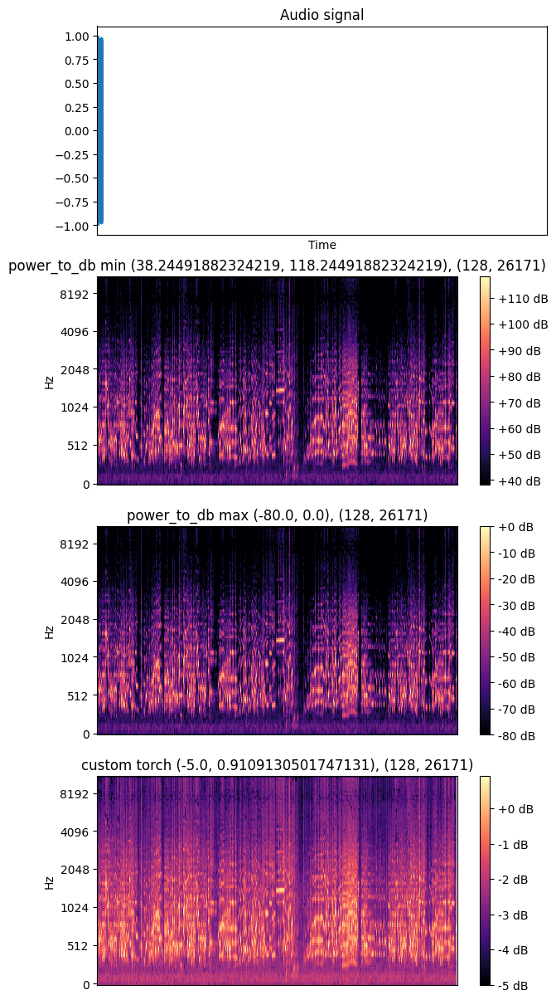

In [ ]:
#@title Spectrogram test

v, _ = librosa.load(flute_file_list[1], sr=22050)
v = librosa.util.normalize(v)
v_mel = librosa.feature.melspectrogram(y=v, n_fft=1024, hop_length=256, n_mels=128, power=1)
v_mel_librosa = librosa.amplitude_to_db(v_mel)
v_mel_librosa_max = librosa.amplitude_to_db(v_mel, ref=np.max)
v_mel_librosa_min = librosa.amplitude_to_db(v_mel, ref=np.min)
v_mel_custom_torch = audio_to_log_mel_torch(torch.from_numpy(v).unsqueeze(0)).cpu().squeeze(0).numpy()

fig, ax = plt.subplots(nrows=4, sharex=True, figsize=(7, 15))

librosa.display.waveshow(v, ax=ax[0])
librosa.display.specshow(v_mel_librosa_min, y_axis="mel", n_fft=1024, hop_length=256, ax=ax[1])
librosa.display.specshow(v_mel_librosa_max, y_axis="mel", n_fft=1024, hop_length=256, ax=ax[2])
librosa.display.specshow(v_mel_custom_torch, y_axis="mel", n_fft=1024, hop_length=256, ax=ax[3])

b = librosa.display.specshow(v_mel_librosa_min, y_axis="mel", n_fft=1024, hop_length=256, ax=ax[1])
c = librosa.display.specshow(v_mel_librosa_max, y_axis="mel", n_fft=1024, hop_length=256, ax=ax[2])
d = librosa.display.specshow(v_mel_custom_torch, y_axis="mel", n_fft=1024, hop_length=256, ax=ax[3])

ax[0].set(title=f"Audio signal")
ax[1].set(title=f"power_to_db min ({v_mel_librosa_min.min()}, {v_mel_librosa_min.max()}), {v_mel_librosa.shape}")
ax[2].set(title=f"power_to_db max ({v_mel_librosa_max.min()}, {v_mel_librosa_max.max()}), {v_mel_librosa.shape}")
ax[3].set(title=f"custom torch ({v_mel_custom_torch.min()}, {v_mel_custom_torch.max()}), {v_mel_librosa.shape}")

plt.colorbar(b, format="%+2.0f dB")
plt.colorbar(c, format="%+2.0f dB")
plt.colorbar(d, format="%+2.0f dB")

plt.show()

In [ ]:
#@title CustomDataset

class SpectrogramDataset(Dataset):
    def __init__(self, voice_dir, instrument_dir, mean_voice, mean_instrument, std_voice, std_instrument, crop_size, target_sample_rate, target_duration, n_fft, hop_length, n_mels, win_length, fmin, fmax, n_steps, max_samples, device):
        self.voice_dir = voice_dir
        self.instrument_dir = instrument_dir
        self.mean_voice = mean_voice
        self.mean_instrument = mean_instrument
        self.std_voice = std_voice
        self.std_instrument = std_instrument
        self.device = device
        self.crop_size = crop_size
        self.target_sample_rate = target_sample_rate
        self.target_duration = target_duration
        self.target_length = target_sample_rate * target_duration
        self.max_samples = max_samples
        self.n_fft = n_fft
        self.hop_length = hop_length
        self.n_mels = n_mels
        self.win_length = win_length
        self.fmin = fmin
        self.fmax = fmax
        self.n_steps = n_steps

        self.voice_path_list = self._prepare_audio_path(self.voice_dir)
        self.instrument_segments = self._prepare_audio_segments(self.instrument_dir)

        self.voice_index_list = self._prepare_index_list(self.voice_path_list)
        self.instrument_index_list = self._prepare_index_list(self.instrument_segments)

        # print(self.voice_len)
        # print(self.instrument_len)
        # print(self._to_tensor(self._audio_to_mel_spectrogram_db(self._load_audio_signal(self.voice_path_list[0]))).shape)
        # print(self._to_tensor(self._audio_to_mel_spectrogram_db(self._load_audio_segments(self.instrument_segments[0]))).shape)

    def __len__(self):
        return self.max_samples

    def __getitem__(self, index):
        voice_index = self.voice_index_list[index]
        voice_signal = self._load_audio_signal(voice_index["path"])
        voice_pitch_shift_signal = self.pitch_shift(voice_signal)
        voice_mel = self._audio_to_mel_spectrogram(self._to_tensor(voice_pitch_shift_signal).unsqueeze(0))
        voice_mel_norm = self._normalize_mel_spectrogram(voice_mel, self.mean_voice, self.std_voice)
        voice_mel_crop = self._crop(voice_mel_norm, voice_index["crop_start"])
        voice_mel_crop_mask = self._mask(voice_mel_crop, voice_index["mask_start"], voice_index["mask_len"])

        instrument_index = self.instrument_index_list[index]
        instrument_signal = self._load_audio_segments((instrument_index["path"], instrument_index["start"]))
        instrument_signal = self._to_tensor(instrument_signal)
        instrument_mel = self._audio_to_mel_spectrogram(instrument_signal.unsqueeze(0))
        instrument_mel_norm = self._normalize_mel_spectrogram(instrument_mel, self.mean_instrument, self.std_instrument)
        instrument_mel_crop = self._crop(instrument_mel_norm, instrument_index["crop_start"])
        instrument_mel_crop_mask = self._mask(instrument_mel_crop, instrument_index["mask_start"], instrument_index["mask_len"])

        assert voice_mel_crop.shape == instrument_mel_crop.shape
        assert voice_mel_crop_mask.shape == instrument_mel_crop_mask.shape

        return {
            "voice": voice_mel,
            "instrument": instrument_mel,
            "voice_signal": voice_signal,
            "voice_pitch_shift_signal": voice_pitch_shift_signal,
            "instrument_signal": instrument_signal,
            "voice_crop": voice_mel_crop,
            "instrument_crop": instrument_mel_crop,
            "voice_mask": voice_mel_crop_mask,
            "instrument_mask": instrument_mel_crop_mask
        }

    def _mask(self, x, mask_start, mask_len):
        mask = np.ones_like(x)
        mask[:, :, mask_start:mask_start + mask_len] = 0
        return mask

    def _crop(self, x, crop_start):
        return x[:, :, crop_start:crop_start + self.crop_size]

    def pitch_shift(self, signal):
        return librosa.effects.pitch_shift(y=signal, sr=self.target_sample_rate, n_steps=self.n_steps)

    def _to_tensor(self, x):
        return torch.from_numpy(x)

    def _prepare_index_list(self, path_list):
        index_list = []
        if len(path_list[0]) == 2:
            while len(index_list) < self.max_samples:
                for path, start in path_list:
                    random_crop_start = np.random.randint(0, self.target_length // self.hop_length - self.crop_size)
                    remaining = self.crop_size
                    current_start = 0

                    while remaining > self.crop_size // 3 and len(index_list) < self.max_samples:
                        max_mask = min(self.crop_size // 2, remaining)
                        mask_len = np.random.randint(0, max_mask + 1)

                        index_list.append({
                            "path": path,
                            "start": start,
                            "crop_start": random_crop_start,
                            "mask_start": current_start,
                            "mask_len": mask_len
                        })

                        current_start += mask_len
                        remaining -= mask_len

        else:
            while len(index_list) < self.max_samples:
                for path in path_list:
                    random_crop_start = np.random.randint(0, self.target_length // self.hop_length - self.crop_size)
                    remaining = self.crop_size
                    current_start = 0

                    while remaining > self.crop_size // 3 and len(index_list) < self.max_samples:
                        max_mask = min(self.crop_size // 2, remaining)
                        mask_len = np.random.randint(0, max_mask + 1)

                        index_list.append({
                            "path": path,
                            "crop_start": random_crop_start,
                            "mask_start": current_start,
                            "mask_len": mask_len
                        })

                        current_start += mask_len
                        remaining -= mask_len

        return index_list

    def _prepare_audio_path(self, audio_dir):
        audio_path_list = []
        file_list = os.listdir(audio_dir)
        random.shuffle(file_list)
        for f in file_list:
            if f.endswith(".wav"):
                audio_path = os.path.join(audio_dir, f)
                info = sf.info(audio_path)
                audio_duration = info.duration

                if info.duration < self.target_duration:
                    continue

                audio_path_list.append(audio_path)

        return audio_path_list

    def _load_audio_signal(self, audio_path):
        signal, _ = librosa.load(audio_path,
                                sr=self.target_sample_rate,
                                duration=self.target_duration,
                                mono=True)

        return signal

    def _prepare_audio_segments(self, audio_dir):
        segments = []
        audio_files = [os.path.join(audio_dir, f) for f in os.listdir(audio_dir) if f.endswith(".wav")]

        for audio_path in audio_files:
            info = sf.info(audio_path)
            audio_duration = info.duration

            if audio_duration < self.target_duration:
                continue

            for start in range(0, int(audio_duration) - self.target_duration + 1, self.target_duration):
                segments.append((audio_path, start))

                if len(segments) >= self.max_samples:
                    return segments

        return segments

    def _load_audio_segments(self, segment_info):
        file_path, start_pos = segment_info

        signal, sr = librosa.load(
            file_path,
            offset=start_pos,
            duration=self.target_duration,
            sr=self.target_sample_rate,
            mono=True
        )

        assert sr == self.target_sample_rate
        assert len(signal) == self.target_length

        return signal

    def _audio_to_mel_spectrogram(self, signal):
        signal = signal.to(self.device)
        mel_basis = librosa.filters.mel(
            sr=self.target_sample_rate,
            n_fft=self.n_fft,
            n_mels=self.n_mels,
            fmin=self.fmin,
            fmax=self.fmax
        )
        mel_basis = torch.from_numpy(mel_basis).float().to(self.device)
        window = torch.hann_window(self.win_length).to(self.device)

        p = (self.n_fft - self.hop_length) // 2
        audio = F.pad(signal, (p, p), mode="reflect").squeeze(1)

        stft = torch.stft(
            audio,
            n_fft=self.n_fft,
            hop_length=self.hop_length,
            win_length=self.win_length,
            window=window,
            center=False,
            return_complex=False
        )

        real, imag = stft.unbind(-1)
        magnitude = torch.sqrt(real ** 2 + imag ** 2)
        mel_output = torch.matmul(mel_basis, magnitude)
        log_mel_spec = torch.log10(torch.clamp(mel_output, min=1e-5))

        return log_mel_spec.cpu().numpy()

    def _normalize_mel_spectrogram(self, x, mean, std):
        return (x - mean) / std

In [ ]:
#@title HYPERPARAMETER

CURRENT_DIR = "/content/"
DRIVE_DIR = "/content/drive/MyDrive/dataset/"
OUTPUT_DIR = os.path.join(DRIVE_DIR, "cyclegan_output")
VOICE_DIR = os.path.join(CURRENT_DIR, "wav_data_sync_with_midi")
VIOLIN_DIR = os.path.join(CURRENT_DIR, "violin")
FLUTE_DIR = os.path.join(CURRENT_DIR, "flute_audio")
VIOLIN_LOG_DIR = os.path.join(OUTPUT_DIR, "violin_training_log.txt")
FLUTE_LOG_DIR = os.path.join(OUTPUT_DIR, "flute_training_log.txt")
MASK_LOG_DIR_1 = os.path.join(OUTPUT_DIR, "mask_training_log_1.txt")
MASK_CHECKPOINT_DIR_1 = os.path.join(OUTPUT_DIR, "mask_checkpoint_1.pth.tar")

HIFI_VIOLIN_CHECKPOINT_DIR = "/content/drive/My Drive/dataset/hifigan/violin/checkpoint_violin.pth"
HIFI_FLUTE_CHECKPOINT_DIR = "/content/drive/My Drive/dataset/hifigan/flutee/hifigan_flute.pth"

BATCH_SIZE = 1
CROP_SIZE = 256
SR = 22050
N_FFT = 1024
HOP_LENGTH = 256
N_MELS = 128
WIN_LENGTH = 1024
FMIN = 0
FMAX = None
N_STEPS = 0
TARGET_DURATION = 4
MAX_SAMPLES = 10000
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

HYPERPARAMETER = {
    "device": DEVICE,
    "generator_lr": 0.0002,
    "discriminator_lr": 0.0001,
    "identity_lambda": 5,
    "cycle_lambda": 1,
    "mel_dim": N_MELS,
    "time_dim": CROP_SIZE,
    "batch_size": BATCH_SIZE
}

mean_voice = -2.6863
std_voice = 1.1440
mean_violin = -3.0588
std_violin = 0.9845
mean_flute = -2.8306
std_flute = 0.9133

In [ ]:
#@title Dataloader

violin_dataset = SpectrogramDataset(voice_dir=VOICE_DIR,
                                    instrument_dir=VIOLIN_DIR,
                                    mean_voice=mean_voice,
                                    mean_instrument=mean_violin,
                                    std_voice=std_voice,
                                    std_instrument=std_violin,
                                    crop_size=CROP_SIZE,
                                    target_sample_rate=SR,
                                    target_duration=TARGET_DURATION,
                                    n_fft=N_FFT,
                                    hop_length=HOP_LENGTH,
                                    n_mels=N_MELS,
                                    win_length=WIN_LENGTH,
                                    fmin=FMIN,
                                    fmax=FMAX,
                                    n_steps=0,
                                    max_samples=MAX_SAMPLES,
                                    device=DEVICE)

flute_dataset = SpectrogramDataset(voice_dir=VOICE_DIR,
                                   instrument_dir=FLUTE_DIR,
                                   mean_voice=mean_voice,
                                   mean_instrument=mean_flute,
                                   std_voice=std_voice,
                                   std_instrument=std_flute,
                                   crop_size=CROP_SIZE,
                                   target_sample_rate=SR,
                                   target_duration=TARGET_DURATION,
                                   n_fft=N_FFT,
                                   hop_length=HOP_LENGTH,
                                   n_mels=N_MELS,
                                   win_length=WIN_LENGTH,
                                   fmin=FMIN,
                                   fmax=FMAX,
                                   n_steps=0,
                                   max_samples=MAX_SAMPLES,
                                   device=DEVICE)


violin_loader = DataLoader(violin_dataset,
                           batch_size=8,
                           shuffle=True,
                           num_workers=0,
                           pin_memory=True)

flute_loader = DataLoader(flute_dataset,
                          batch_size=8,
                          shuffle=True,
                          num_workers=0,
                          pin_memory=True)


violin_loader_batch = next(iter(violin_loader))
flute_loader_batch = next(iter(flute_loader))

print(violin_loader_batch.keys())
print(len(violin_loader))
print(violin_loader_batch["voice"].shape)
print(violin_loader_batch["instrument"].shape)
print(violin_loader_batch["voice_crop"].shape)
print(violin_loader_batch["instrument_crop"].shape)
print(violin_loader_batch["voice_mask"].shape)
print(violin_loader_batch["instrument_mask"].shape)

print(flute_loader_batch.keys())
print(len(flute_loader))
print(flute_loader_batch["voice"].shape)
print(flute_loader_batch["instrument"].shape)
print(flute_loader_batch["voice_crop"].shape)
print(flute_loader_batch["instrument_crop"].shape)
print(flute_loader_batch["voice_mask"].shape)
print(flute_loader_batch["instrument_mask"].shape)

dict_keys(['voice', 'instrument', 'voice_signal', 'voice_pitch_shift_signal', 'instrument_signal', 'voice_crop', 'instrument_crop', 'voice_mask', 'instrument_mask'])
1250
torch.Size([8, 1, 128, 344])
torch.Size([8, 1, 128, 344])
torch.Size([8, 1, 128, 256])
torch.Size([8, 1, 128, 256])
torch.Size([8, 1, 128, 256])
torch.Size([8, 1, 128, 256])
dict_keys(['voice', 'instrument', 'voice_signal', 'voice_pitch_shift_signal', 'instrument_signal', 'voice_crop', 'instrument_crop', 'voice_mask', 'instrument_mask'])
1250
torch.Size([8, 1, 128, 344])
torch.Size([8, 1, 128, 344])
torch.Size([8, 1, 128, 256])
torch.Size([8, 1, 128, 256])
torch.Size([8, 1, 128, 256])
torch.Size([8, 1, 128, 256])


In [ ]:
# mean_voice, mean_violin, std_voice, std_violin = get_mean_std(violin_loader)
# print(mean_voice)
# print(mean_violin)
# print(std_voice)
# print(std_violin)

tensor([-2.6863])
tensor([-3.0588])
tensor([1.1440])
tensor([0.9845])


In [ ]:
# mean_voice, mean_violin, std_voice, std_violin = get_mean_std(flute_loader)
# print(mean_voice)
# print(mean_violin)
# print(std_voice)
# print(std_violin)

tensor([-2.6862])
tensor([-2.8306])
tensor([1.1439])
tensor([0.9133])


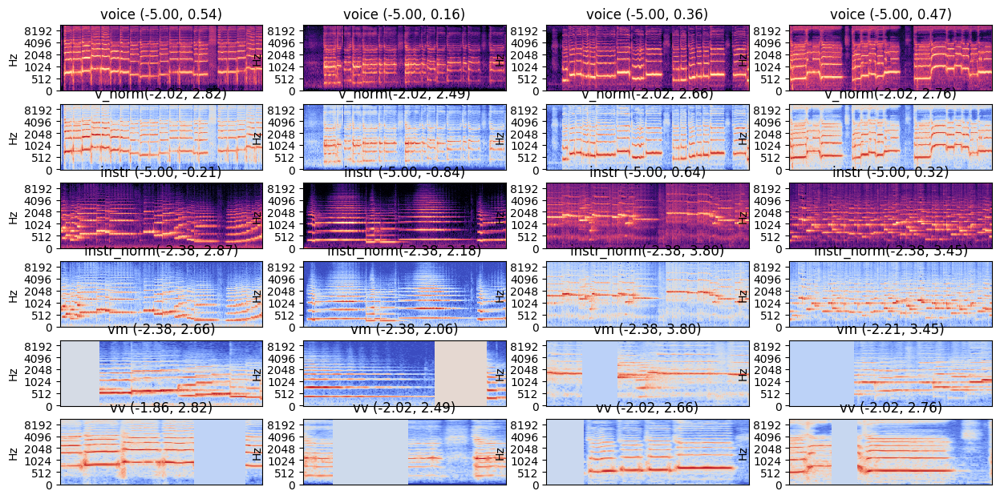

In [ ]:
#@title Plot dataloader

# violin_loader_batch = next(iter(violin_loader))
# violin_loader_batch_voice = violin_loader_batch["voice"]
# violin_loader_batch_instrument = violin_loader_batch["instrument"]
# violin_loader_batch_voice_crop = violin_loader_batch["voice_crop"]
# violin_loader_batch_instrument_crop = violin_loader_batch["instrument_crop"]
# violin_loader_batch_voice_mask = violin_loader_batch["voice_mask"]
# violin_loader_batch_instrument_mask = violin_loader_batch["instrument_mask"]

flute_loader_batch = next(iter(flute_loader))
flute_loader_batch_voice = flute_loader_batch["voice"]
flute_loader_batch_instrument = flute_loader_batch["instrument"]
flute_loader_batch_voice_crop = flute_loader_batch["voice_crop"]
flute_loader_batch_instrument_crop = flute_loader_batch["instrument_crop"]
flute_loader_batch_voice_mask = flute_loader_batch["voice_mask"]
flute_loader_batch_instrument_mask = flute_loader_batch["instrument_mask"]

plt.figure(figsize=(15, 10))
cols = 4

for idx in range(cols):
    plt.subplot(8, cols, idx + 1)
    plt.title(f"voice ({flute_loader_batch_voice[idx].min():.2f}, {flute_loader_batch_voice[idx].max():.2f})")
    librosa.display.specshow(torch_to_np(flute_loader_batch_voice[idx]), y_axis="mel", hop_length=HOP_LENGTH, n_fft=N_FFT)

    plt.subplot(8, cols, cols + idx + 1)
    normalized_voice = normalize(flute_loader_batch_voice[idx], mean_voice, std_voice)
    plt.title(f"v_norm({normalized_voice.min():.2f}, {normalized_voice.max():.2f})")
    librosa.display.specshow(torch_to_np(normalized_voice), y_axis="mel", hop_length=HOP_LENGTH, n_fft=N_FFT)

    plt.subplot(8, cols, cols * 2 + idx + 1)
    plt.title(f"instr ({flute_loader_batch_instrument[idx].min():.2f}, {flute_loader_batch_instrument[idx].max():.2f})")
    librosa.display.specshow(torch_to_np(flute_loader_batch_instrument[idx]), y_axis="mel", hop_length=HOP_LENGTH, n_fft=N_FFT)

    plt.subplot(8, cols, cols * 3 + idx + 1)
    normalized_instrument = normalize(flute_loader_batch_instrument[idx], mean_flute, std_flute)
    plt.title(f"instr_norm({normalized_instrument.min():.2f}, {normalized_instrument.max():.2f})")
    librosa.display.specshow(torch_to_np(normalized_instrument), y_axis="mel", hop_length=HOP_LENGTH, n_fft=N_FFT)

    plt.subplot(8, cols, cols * 4 + idx + 1)
    flute_mask = flute_loader_batch_instrument_mask[idx] * flute_loader_batch_instrument_crop[idx]
    plt.title(f"vm ({flute_mask.min():.2f}, {flute_mask.max():.2f})")
    librosa.display.specshow(torch_to_np(flute_mask), y_axis="mel", hop_length=HOP_LENGTH, n_fft=N_FFT)

    plt.subplot(8, cols, cols * 5 + idx + 1)
    flute_voice_mask = flute_loader_batch_voice_mask[idx] * flute_loader_batch_voice_crop[idx]
    plt.title(f"vv ({flute_voice_mask.min():.2f}, {flute_voice_mask.max():.2f})")
    librosa.display.specshow(torch_to_np(flute_voice_mask), y_axis="mel", hop_length=HOP_LENGTH, n_fft=N_FFT)

    # plt.subplot(8, cols, idx + 1)
    # flute_voice_mask = flute_loader_batch_voice_mask[idx] * flute_loader_batch_voice_crop[idx]
    # plt.title(f"fv ({flute_voice_mask.min():.2f}, {flute_voice_mask.max():.2f})")
    # librosa.display.specshow(torch_to_np(flute_voice_mask), y_axis="mel", hop_length=HOP_LENGTH, n_fft=N_FFT)

    # plt.subplot(8, cols, cols * 2 + idx + 1)
    # flute_mask = flute_loader_batch_instrument_mask[idx] * flute_loader_batch_instrument_crop[idx]
    # plt.title(f"fm ({flute_mask.min():.2f}, {flute_mask.max():.2f})")
    # librosa.display.specshow(torch_to_np(flute_mask), y_axis="mel", hop_length=HOP_LENGTH, n_fft=N_FFT)



plt.show()

In [ ]:
#@title CycleGan module

class TFAN_1D(nn.Module):
  def __init__(self, norm_channels, in_channels, out_channels=128, kernel_size=5):
      super().__init__()
      self.param_free_norm = nn.InstanceNorm1d(norm_channels, affine=False)
      self.conv_shared_first = nn.Sequential(
          nn.Conv1d(in_channels=in_channels,
                    out_channels=out_channels,
                    kernel_size=kernel_size,
                    padding="same"),
          nn.ReLU()
      )
      self.conv_shared = nn.Sequential(
          nn.Conv1d(in_channels=out_channels,
                    out_channels=out_channels,
                    kernel_size=kernel_size,
                    padding="same"),
          nn.ReLU()
      )
      self.conv_gamma = nn.Conv1d(in_channels=out_channels,
                                out_channels=norm_channels,
                                kernel_size=kernel_size,
                                padding="same")
      self.conv_beta = nn.Conv1d(in_channels=out_channels,
                                out_channels=norm_channels,
                                kernel_size=kernel_size,
                                padding="same")

  def forward(self, x, segmap):
      # print("x shape", x.shape)
      # print("segmap shape", segmap.shape)
      normalized = self.param_free_norm(x)
      # print("x normalized shape", normalized.shape)
      segmap = nn.functional.interpolate(segmap, size=x.size()[2:], mode="nearest")
      # print("segmap interpolate shape", segmap.shape)
      conv_shared_1 = self.conv_shared_first(segmap)
      conv_shared_2 = self.conv_shared(conv_shared_1)
      conv_shared_3 = self.conv_shared(conv_shared_2)
      # print("conv shared shape", conv_shared_3.shape)
      gamma = self.conv_gamma(conv_shared_3)
      # print("gamma shape", gamma.shape)
      beta = self.conv_beta(conv_shared_3)
      # print("beta shape", beta.shape)
      output = normalized * gamma + beta
      # print("output shape", output.shape)
      return output

class TFAN_2D(nn.Module):
  def __init__(self, norm_channels, in_channels=1, out_channels=128, kernel_size=5):
      super().__init__()
      self.param_free_norm = nn.InstanceNorm2d(norm_channels, affine=False)
      self.conv_shared_first = nn.Sequential(
          nn.Conv2d(in_channels=in_channels,
                    out_channels=out_channels,
                    kernel_size=kernel_size,
                    padding="same"),
          nn.ReLU()
      )
      self.conv_shared = nn.Sequential(
          nn.Conv2d(in_channels=out_channels,
                    out_channels=out_channels,
                    kernel_size=kernel_size,
                    padding="same"),
          nn.ReLU()
      )
      self.conv_gamma = nn.Conv2d(in_channels=out_channels,
                                 out_channels=norm_channels,
                                 kernel_size=kernel_size,
                                 padding="same")
      self.conv_beta = nn.Conv2d(in_channels=out_channels,
                                 out_channels=norm_channels,
                                 kernel_size=kernel_size,
                                 padding="same")

  def forward(self, x, segmap):
      # print("x shape", x.shape)
      # print("segmap shape", segmap.shape)
      normalized = self.param_free_norm(x)
      # print("x normalized shape", normalized.shape)
      segmap = nn.functional.interpolate(segmap, size=x.size()[2:], mode="nearest")
      # print("segmap interpolate shape", segmap.shape)
      conv_shared_1 = self.conv_shared_first(segmap)
      conv_shared_2 = self.conv_shared(conv_shared_1)
      conv_shared_3 = self.conv_shared(conv_shared_2)
      # print("conv shared shape", conv_shared_3.shape)
      gamma = self.conv_gamma(conv_shared_3)
      # print("gamma shape", gamma.shape)
      beta = self.conv_beta(conv_shared_3)
      # print("beta shape", beta.shape)
      output = normalized * gamma + beta
      # print("output shape", output.shape)
      return output

class ResidualLayer(nn.Module):
  def __init__(self, in_channels, out_channels, kernel_size, stride, padding):
      super(ResidualLayer, self).__init__()
      self.residualLayer = nn.Sequential(
          nn.Conv1d(in_channels=in_channels,
                    out_channels=out_channels,
                    kernel_size=kernel_size,
                    stride=1,
                    padding=padding),
          nn.InstanceNorm1d(num_features=out_channels,
                            affine=True),
          nn.GLU(dim=1),
          nn.Conv1d(in_channels=out_channels // 2,
                    out_channels=in_channels,
                    kernel_size=kernel_size,
                    stride=1,
                    padding=padding),
          nn.InstanceNorm1d(num_features=in_channels,
                            affine=True)
      )

  def forward(self, x):
      return self.residualLayer(x) + x

class UpSample(nn.Module):
  def __init__(self, in_channels, out_channels, kernel_size, stride, padding, model):
      super(UpSample, self).__init__()
      if model == "VC3":
          self.upLayer = nn.Sequential(
              nn.Conv2d(in_channels=in_channels,
                        out_channels=out_channels,
                        kernel_size=kernel_size,
                        stride=stride,
                        padding=padding),
              nn.PixelShuffle(upscale_factor=2)
          )
      elif model == "VC2":
          self.upLayer = nn.Sequential(
              nn.Conv2d(in_channels=in_channels,
                        out_channels=out_channels,
                        kernel_size=kernel_size,
                        stride=stride,
                        padding=padding),
              nn.PixelShuffle(upscale_factor=2),
              nn.InstanceNorm2d(num_features=out_channels // 4,
                                affine=True),
              nn.GLU(dim=1)
          )

  def forward(self, x):
    return self.upLayer(x)

class DownSample(nn.Module):
  def __init__(self, in_channels, out_channels, kernel_size, stride, padding):
      super(DownSample, self).__init__()
      self.downLayer = nn.Sequential(
          nn.Conv2d(in_channels=in_channels,
                    out_channels=out_channels,
                    kernel_size=kernel_size,
                    stride=stride,
                    padding=padding),
          nn.InstanceNorm2d(num_features=out_channels,
                            affine=True),
          nn.GLU(dim=1)
      )

  def forward(self, x):
    return self.downLayer(x)

class VC3Generator(nn.Module):
  def __init__(self, mel_dim, time_dim, debug_mode=False):
      super().__init__()
      self.mel_dim = mel_dim
      self.time_dim = time_dim
      self.debug_mode = debug_mode

      self.conv_first = nn.Sequential(
          nn.Conv2d(in_channels=1,
                    out_channels=128,
                    kernel_size=(5, 15),
                    stride=1,
                    padding=(2, 7)),
          nn.GLU(dim=1)
      )

      self.downsample_1 = DownSample(in_channels=64,
                                     out_channels=256,
                                     kernel_size=5,
                                     stride=2,
                                     padding=2)

      self.downsample_2 = DownSample(in_channels=128,
                                     out_channels=512,
                                     kernel_size=5,
                                     stride=2,
                                     padding=2)

      self.conv_2to1 = nn.Sequential(
          nn.Conv1d(in_channels=256 * round(self.mel_dim / 4),
                    out_channels=256,
                    kernel_size=1,
                    stride=1,
                    padding=0),
          nn.InstanceNorm1d(num_features=256,
                            affine=True)
      )

      self.residual_block = nn.Sequential(
          *[ResidualLayer(in_channels=256,
                         out_channels=512,
                         kernel_size=3,
                         stride=1,
                         padding=1) for _ in range(6)]
      )

      self.conv_1to2 = nn.Conv1d(in_channels=256,
                                 out_channels=256 * round(self.mel_dim / 4),
                                 kernel_size=1,
                                 stride=1,
                                 padding=0)

      self.conv_1to2_tfan = TFAN_1D(256 * round(self.mel_dim / 4), in_channels=self.mel_dim)

      self.upsample_1 = UpSample(in_channels=256,
                                 out_channels=1024,
                                 kernel_size=5,
                                 stride=1,
                                 padding=2,
                                 model="VC3")

      self.upsample_1_tfan = TFAN_2D(1024 // 4)

      self.glu = nn.GLU(dim=1)

      self.upsample_2 = UpSample(in_channels=128,
                                 out_channels=512,
                                 kernel_size=5,
                                 stride=1,
                                 padding=2,
                                 model="VC3")

      self.upsample_2_tfan = TFAN_2D(512 // 4)

      self.conv_last = nn.Conv2d(in_channels=64,
                                 out_channels=1,
                                 kernel_size=(5, 15),
                                 stride=1,
                                 padding=(2, 7))

  def forward(self, x):
      seg_2d = x.detach().clone()
      seg_1d = x.detach().clone().squeeze(dim=1)
      conv_first = self.conv_first(x)

      downsample_1 = self.downsample_1(conv_first)
      downsample_2 = self.downsample_2(downsample_1)

      reshape_2to1 = downsample_2.view(downsample_2.size(0), 256 * round(self.mel_dim / 4), 1, -1)
      reshape_2to1 = reshape_2to1.squeeze(2)
      conv_2to1 = self.conv_2to1(reshape_2to1)

      residual_block = self.residual_block(conv_2to1)

      conv_1to2 = self.conv_1to2(residual_block)
      conv_1to2 = self.conv_1to2_tfan(conv_1to2, seg_1d)

      reshape_1to2 = conv_1to2.unsqueeze(2)
      reshape_1to2 = reshape_1to2.view(reshape_1to2.size(0), 256, round(self.mel_dim / 4), -1)

      upsample_1 = self.upsample_1(reshape_1to2)
      upsample_1 = self.upsample_1_tfan(upsample_1, seg_2d)
      upsample_1 = self.glu(upsample_1)

      upsample_2 = self.upsample_2(upsample_1)
      upsample_2 = self.upsample_2_tfan(upsample_2, seg_2d)
      upsample_2 = self.glu(upsample_2)

      output = self.conv_last(upsample_2)

      output = output[:, :, :self.mel_dim, :self.time_dim]

      if self.debug_mode:
          print("input shape", x.shape)
          print("seg_2d shape", seg_2d.shape)
          print("seg_1d shape", seg_1d.shape)
          print("conv_first shape", conv_first.shape)
          print("downsample_1 shape", downsample_1.shape)
          print("downsample_2 shape", downsample_2.shape)
          print("reshape_2to1 shape", reshape_2to1.shape)
          print("reshape_2to1 squeeze shape", reshape_2to1.shape)
          print("conv_2to1 shape", conv_2to1.shape)
          print("residual_block shape", residual_block.shape)
          print("conv_1to2 shape", conv_1to2.shape)
          print("reshape_1to2 unsqueeze shape", reshape_1to2.shape)
          print("reshape_1to2 shape", reshape_1to2.shape)
          print("upsample_1 shape", upsample_1.shape)
          print("upsample_2 shape", upsample_2.shape)
          print("output shape", output.shape)

      return output

class VC2Generator(nn.Module):
  def __init__(self, mel_dim, time_dim, debug_mode=False):
      super().__init__()
      self.mel_dim = mel_dim
      self.time_dim = time_dim
      self.debug_mode = debug_mode

      self.conv_first = nn.Sequential(
          nn.Conv2d(in_channels=2,
                    out_channels=128,
                    kernel_size=(5, 15),
                    stride=1,
                    padding=(2, 7)),
          nn.GLU(dim=1)
      )

      self.downsample_1 = DownSample(in_channels=64,
                                     out_channels=256,
                                     kernel_size=5,
                                     stride=2,
                                     padding=2)

      self.downsample_2 = DownSample(in_channels=128,
                                     out_channels=512,
                                     kernel_size=5,
                                     stride=2,
                                     padding=2)

      self.conv_2to1 = nn.Sequential(
          nn.Conv1d(in_channels=256 * round(self.mel_dim / 4),
                    out_channels=256,
                    kernel_size=1,
                    stride=1,
                    padding=0),
          nn.InstanceNorm1d(num_features=256,
                            affine=True)
      )

      self.residual_block = nn.Sequential(
          *[ResidualLayer(in_channels=256,
                         out_channels=512,
                         kernel_size=3,
                         stride=1,
                         padding=1) for _ in range(6)]
      )

      self.conv_1to2 = nn.Sequential(
          nn.Conv1d(in_channels=256,
                    out_channels=256 * round(self.mel_dim / 4),
                    kernel_size=1,
                    stride=1,
                    padding=0),
          nn.InstanceNorm1d(num_features=256 * round(self.mel_dim / 4),
                            affine=True)
      )


      self.upsample_1 = UpSample(in_channels=256,
                                 out_channels=1024,
                                 kernel_size=5,
                                 stride=1,
                                 padding=2,
                                 model="VC2")

      self.upsample_2 = UpSample(in_channels=128,
                                 out_channels=512,
                                 kernel_size=5,
                                 stride=1,
                                 padding=2,
                                 model="VC2")

      self.conv_last = nn.Conv2d(in_channels=64,
                                 out_channels=1,
                                 kernel_size=(5, 15),
                                 stride=1,
                                 padding=(2, 7))

  def forward(self, x, mask):
      x = torch.concat((x, mask), dim=1)
      conv_first = self.conv_first(x)

      downsample_1 = self.downsample_1(conv_first)
      downsample_2 = self.downsample_2(downsample_1)

      reshape_2to1 = downsample_2.view(downsample_2.size(0), 256 * round(self.mel_dim / 4), 1, -1)
      reshape_2to1 = reshape_2to1.squeeze(2)
      conv_2to1 = self.conv_2to1(reshape_2to1)

      residual_block = self.residual_block(conv_2to1)

      conv_1to2 = self.conv_1to2(residual_block)

      reshape_1to2 = conv_1to2.unsqueeze(2)
      reshape_1to2 = reshape_1to2.view(reshape_1to2.size(0), 256, round(self.mel_dim / 4), -1)

      upsample_1 = self.upsample_1(reshape_1to2)
      upsample_2 = self.upsample_2(upsample_1)

      output = self.conv_last(upsample_2)
      output = output[:, :, :self.mel_dim, :self.time_dim]

      if self.debug_mode:
          print("input shape", x.shape)
          print("conv_first shape", conv_first.shape)
          print("downsample_1 shape", downsample_1.shape)
          print("downsample_2 shape", downsample_2.shape)
          print("reshape_2to1 shape", reshape_2to1.shape)
          print("reshape_2to1 squeeze shape", reshape_2to1.shape)
          print("conv_2to1 shape", conv_2to1.shape)
          print("residual_block shape", residual_block.shape)
          print("conv_1to2 shape", conv_1to2.shape)
          print("reshape_1to2 unsqueeze shape", reshape_1to2.shape)
          print("reshape_1to2 shape", reshape_1to2.shape)
          print("upsample_1 shape", upsample_1.shape)
          print("upsample_2 shape", upsample_2.shape)
          print("output shape", output.shape)

      return output

class Discriminator(nn.Module):
    def __init__(self):
       super(Discriminator, self).__init__()
       self.conv_first = nn.Sequential(
           nn.Conv2d(in_channels=1,
                     out_channels=128,
                     kernel_size=3,
                     stride=1,
                     padding=1),
           nn.GLU(dim=1)
       )
       self.downsample_1 = DownSample(in_channels=64,
                                      out_channels=256,
                                      kernel_size=3,
                                      stride=2,
                                      padding=1)
       self.downsample_2 = DownSample(in_channels=128,
                                      out_channels=512,
                                      kernel_size=3,
                                      stride=2,
                                      padding=1)
       self.downsample_3 = DownSample(in_channels=256,
                                      out_channels=1024,
                                      kernel_size=3,
                                      stride=2,
                                      padding=1)
       self.downsample_4 = DownSample(in_channels=512,
                                      out_channels=1024,
                                      kernel_size=(1, 10),
                                      stride=2,
                                      padding=1)
       self.conv_last = nn.Conv2d(in_channels=512,
                                  out_channels=1,
                                  kernel_size=(1, 3),
                                  stride=1,
                                  padding=(0, 2))

    def forward(self, x):
        conv_first = self.conv_first(x)
        downsample_1 = self.downsample_1(conv_first)
        downsample_2 = self.downsample_2(downsample_1)
        downsample_3 = self.downsample_3(downsample_2)
        downsample_4 = self.downsample_4(downsample_3)
        output = torch.sigmoid(self.conv_last(downsample_4))
        return output

In [ ]:
#@title HifiGan module

LRELU_SLOPE = 0.1

class ResBlock(nn.Module):
    def __init__(self, channels, kernel_size=5, dilation=(1, 3, 5, 7, 11)):
        super(ResBlock, self).__init__()
        self.convs = nn.ModuleList([
            nn.utils.weight_norm(nn.Conv1d(channels, channels, kernel_size, stride=1,
                                           padding=(kernel_size - 1) // 2 * d, dilation=d))
            for d in dilation
        ])

        self.channel_attn = nn.Sequential(
            nn.AdaptiveAvgPool1d(1),
            nn.Conv1d(channels, channels//4, kernel_size=1),
            nn.LeakyReLU(LRELU_SLOPE),
            nn.Conv1d(channels//4, channels, kernel_size=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        residual = x
        for conv in self.convs:
            x = F.leaky_relu(conv(x), LRELU_SLOPE)

        attn = self.channel_attn(x)
        x = x * attn

        return x + residual


class HIFI_Generator(nn.Module):
    def __init__(self, in_channels=128, out_channels=1):
        super(HIFI_Generator, self).__init__()
        self.initial = nn.utils.weight_norm(nn.Conv1d(in_channels, 512, kernel_size=9, stride=1, padding=3))

        self.upsample = nn.Sequential(
            nn.LeakyReLU(LRELU_SLOPE),
            nn.ConvTranspose1d(512, 256, kernel_size=16, stride=4, padding=6),
            nn.LeakyReLU(LRELU_SLOPE),
            nn.ConvTranspose1d(256, 128, kernel_size=16, stride=4, padding=6),
            nn.LeakyReLU(LRELU_SLOPE),
            nn.ConvTranspose1d(128, 64,  kernel_size=8,  stride=4, padding=3),
            nn.LeakyReLU(LRELU_SLOPE),
            nn.ConvTranspose1d(64, 32,   kernel_size=8,  stride=4, padding=3),
)

        self.resblocks_standard = nn.ModuleList([ResBlock(32, dilation=(1, 3, 5, 7)) for _ in range(4)])
        self.resblocks_extended = nn.ModuleList([ResBlock(32, dilation=(1, 3, 5, 7, 11, 15)) for _ in range(4)])

        self.final_layer = nn.utils.weight_norm(nn.Conv1d(32, out_channels, kernel_size=7, stride=1, padding=3))

    def forward(self, x):
        x = self.initial(x)
        x = self.upsample(x)

        for resblock in self.resblocks_standard:
            x = resblock(x)

        for resblock in self.resblocks_extended:
            x = resblock(x)

        x = torch.tanh(self.final_layer(x))
        return x


In [ ]:
#@title CycleGan architecture
from torchsummary import summary

input = ((1,128, 64), (1,128,64))
# vc3generator = VC3Generator(input[1], input[2]).to(DEVICE)
# summary(vc3generator, input)

vc2generator = VC2Generator(128, 64).to(DEVICE)
summary(vc2generator, input)

# discriminator = Discriminator()
# summary(discriminator, input)

TypeError: rand(): argument 'size' failed to unpack the object at pos 2 with error "type must be tuple of ints,but got tuple"

In [ ]:
#@title Training class

class CycleGANTraining():
    def __init__(self, num_epochs, dataset, hyperparameter, checkpoint_basename, log_path, restart_training_at=None):
        self.device = hyperparameter["device"]
        self.mel_dim = hyperparameter["mel_dim"]
        self.time_dim = hyperparameter["time_dim"]
        self.identity_lambda = hyperparameter["identity_lambda"]
        self.cycle_lambda = hyperparameter["cycle_lambda"]
        self.generator_lr = hyperparameter["generator_lr"]
        self.discriminator_lr = hyperparameter["discriminator_lr"]

        self.dataset = dataset
        self.batch_size = hyperparameter["batch_size"]

        self.discriminator_A = Discriminator().to(self.device)
        self.discriminator_B = Discriminator().to(self.device)

        self.generator_A2B = VC2Generator(self.mel_dim, self.time_dim).to(self.device)
        self.generator_B2A = VC2Generator(self.mel_dim, self.time_dim).to(self.device)

        g_params = list(self.generator_A2B.parameters()) + list(self.generator_B2A.parameters())
        d_params = list(self.discriminator_A.parameters()) + list(self.discriminator_B.parameters())

        self.generator_optimizer = torch.optim.Adam(
            g_params, self.generator_lr, betas=(0.5, 0.999)
        )
        self.discriminator_optimizer = torch.optim.Adam(
            d_params, self.discriminator_lr, betas=(0.5, 0.999)
        )
        self.mse_loss = nn.MSELoss()
        self.l1_loss = nn.L1Loss()
        self.g_scaler = torch.amp.GradScaler(self.device)
        self.d_scaler = torch.amp.GradScaler(self.device)

        self.generator_loss_list = []
        self.discriminator_loss_list = []

        self.start_epoch = 0
        self.num_epochs = num_epochs

        self.checkpoint_basename = checkpoint_basename
        self.log_path = log_path

        if restart_training_at is not None:
            self.start_epoch = self.load_checkpoint(restart_training_at)
            print(f"Resumed training at epoch {self.start_epoch}")

    def train(self):
        for epoch in range(self.start_epoch, self.num_epochs):
            dataloader = DataLoader(self.dataset, batch_size=self.batch_size, shuffle=False, num_workers=0, pin_memory=True)
            for idx, batch in enumerate(tqdm(dataloader)):
                num_iterations = len(dataloader) * epoch + idx

                real_A = batch["voice_crop"].to(self.device)
                real_B = batch["instrument_crop"].to(self.device)
                mask_A = batch["voice_mask"].to(self.device)
                mask_B = batch["instrument_mask"].to(self.device)

                with torch.amp.autocast(self.device):
                    fake_B = self.generator_A2B(real_A, mask_A)
                    cycle_A = self.generator_B2A(fake_B, torch.ones_like(fake_B))

                    fake_A = self.generator_B2A(real_B, mask_B)
                    cycle_B = self.generator_A2B(fake_A, torch.ones_like(fake_A))

                    identity_A = self.generator_B2A(real_A, torch.ones_like(real_A))
                    identity_B = self.generator_A2B(real_B, torch.ones_like(real_B))

                    d_fake_A = self.discriminator_A(fake_A)
                    d_fake_B = self.discriminator_B(fake_B)

                    # for second step adverserial loss
                    d_fake_cycle_A = self.discriminator_A(cycle_A)
                    d_fake_cycle_B = self.discriminator_B(cycle_B)

                    # cycle, identity loss
                    cycle_loss = self.l1_loss(real_A, cycle_A) + self.l1_loss(real_B, cycle_B)
                    identity_loss = self.l1_loss(real_A, identity_A) + self.l1_loss(real_B, identity_B)
                    generator_loss_A2B = self.mse_loss(torch.ones_like(d_fake_B), d_fake_B)
                    generator_loss_B2A = self.mse_loss(torch.ones_like(d_fake_A), d_fake_A)

                    # total generator loss
                    generator_loss = generator_loss_A2B + generator_loss_B2A + cycle_loss * self.cycle_lambda + identity_loss * self.identity_lambda
                    self.generator_loss_list.append(generator_loss.item())

                # generator backprop
                self.generator_optimizer.zero_grad()
                self.discriminator_optimizer.zero_grad()
                self.g_scaler.scale(generator_loss).backward()
                self.g_scaler.step(self.generator_optimizer)
                self.g_scaler.update()

                with torch.amp.autocast(self.device):
                    # discriminator forward
                    d_real_A = self.discriminator_A(real_A)
                    d_real_B = self.discriminator_B(real_B)

                    generated_A = self.generator_B2A(real_B, mask_B)
                    d_fake_A = self.discriminator_A(generated_A)

                    # for second step adverserial loss
                    cycled_B = self.generator_A2B(generated_A, torch.ones_like(generated_A))
                    d_cycled_B = self.discriminator_B(cycled_B)

                    generated_B = self.generator_A2B(real_A, mask_B)
                    d_fake_B = self.discriminator_B(generated_B)

                    # for second step adverserial loss
                    cycled_A = self.generator_B2A(generated_B, torch.ones_like(generated_B))
                    d_cycled_A = self.discriminator_A(cycled_A)

                    # loss
                    d_loss_A_real = self.mse_loss(torch.ones_like(d_real_A), d_real_A)
                    d_loss_A_fake = self.mse_loss(torch.zeros_like(d_fake_A), d_fake_A)
                    d_loss_A = (d_loss_A_real + d_loss_A_fake) / 2

                    d_loss_B_real = self.mse_loss(torch.ones_like(d_real_B), d_real_B)
                    d_loss_B_fake = self.mse_loss(torch.zeros_like(d_fake_B), d_fake_B)
                    d_loss_B = (d_loss_B_real + d_loss_B_fake) / 2

                    # second step adverserial loss
                    d_loss_A_cycled = self.mse_loss(torch.zeros_like(d_cycled_A), d_cycled_A)
                    d_loss_B_cycled = self.mse_loss(torch.zeros_like(d_cycled_B), d_cycled_B)
                    d_loss_A_2nd = (d_loss_A_real + d_loss_A_cycled) / 2
                    d_loss_B_2nd = (d_loss_B_real + d_loss_B_cycled) / 2

                    # discriminator loss
                    discriminator_loss = (d_loss_A + d_loss_B) / 2 + (d_loss_A_2nd + d_loss_B_2nd) / 2
                    self.discriminator_loss_list.append(discriminator_loss.item())

                # discriminator backprop
                self.generator_optimizer.zero_grad()
                self.discriminator_optimizer.zero_grad()
                self.d_scaler.scale(discriminator_loss).backward()
                self.d_scaler.step(self.discriminator_optimizer)
                self.d_scaler.update()

                if num_iterations % 100 == 0:
                    log = "Iter: {} | Generator loss: {:.4f} | Discriminator loss: {:.4f} | GA2B: {:.4f} | GB2A: {:.4f} | G_id: {:.4f} | G_cyc: {:.4f} | D_A: {:.4f} | D_B: {:.4f}".format(
                        num_iterations, generator_loss.item(), discriminator_loss.item(),
                        generator_loss_A2B, generator_loss_B2A, identity_loss, cycle_loss,
                        d_loss_A, d_loss_B
                    )
                    self.write_file(log)
                    if num_iterations % 500 == 0:
                        print(log)

                if num_iterations % 5000 == 0 and num_iterations != 0:
                    print(f"Save model checkpoint at iteration {num_iterations}")
                    checkpoint_path = os.path.join(OUTPUT_DIR, f"{self.checkpoint_basename}_{num_iterations}.pth.tar")
                    self.save_checkpoint(epoch, checkpoint_path)

        print(f"Save model checkpoint at iteration {num_iterations + 1}")
        checkpoint_path = os.path.join(OUTPUT_DIR, f"{self.checkpoint_basename}_{num_iterations + 1}.pth.tar")
        self.save_checkpoint(epoch, checkpoint_path)

    def write_file(self, log):
        log = log + "\n"
        with open(self.log_path, "a") as f:
            f.write(log)

    def save_checkpoint(self, epoch, path):
        checkpoint = {
            "epoch": epoch,
            "generator_loss_list": self.generator_loss_list,
            "discriminator_loss_list": self.discriminator_loss_list,
            "generator_A2B_state_dict": self.generator_A2B.state_dict(),
            "generator_B2A_state_dict": self.generator_B2A.state_dict(),
            "discriminator_A_state_dict": self.discriminator_A.state_dict(),
            "discriminator_B_state_dict": self.discriminator_B.state_dict(),
            "generator_optimizer": self.generator_optimizer.state_dict(),
            "discriminator_optimizer": self.discriminator_optimizer.state_dict(),
        }
        torch.save(checkpoint, path)

    def load_checkpoint(self, path):
        checkpoint = torch.load(path, map_location=DEVICE)
        epoch = int(checkpoint["epoch"]) + 1
        self.generator_A2B.load_state_dict(checkpoint["generator_A2B_state_dict"])
        self.generator_B2A.load_state_dict(checkpoint["generator_B2A_state_dict"])
        self.discriminator_A.load_state_dict(checkpoint["discriminator_A_state_dict"])
        self.discriminator_B.load_state_dict(checkpoint["discriminator_B_state_dict"])
        self.generator_optimizer.load_state_dict(checkpoint["generator_optimizer"])
        self.discriminator_optimizer.load_state_dict(checkpoint["discriminator_optimizer"])
        self.generator_loss_list = checkpoint["generator_loss_list"]
        self.discriminator_loss_list = checkpoint["discriminator_loss_list"]

        return epoch

In [ ]:
with torch.no_grad():
    torch.cuda.empty_cache()
gc.collect()

93848

In [ ]:
violin_mask_model = CycleGANTraining(
    num_epochs=2,
    dataset=violin_dataset,
    hyperparameter=HYPERPARAMETER,
    checkpoint_basename="violin_checkpoint",
    log_path=VIOLIN_LOG_DIR,
    restart_training_at=os.path.join(OUTPUT_DIR, "violin_checkpoint_40000.pth.tar")
)

violin_mask_model.train()

Resumed training at epoch 1


  0%|          | 0/50000 [00:00<?, ?it/s]

Iter: 50000 | Generator loss: 2.1665 | Discriminator loss: 0.2210 | GA2B: 0.4275 | GB2A: 0.1896 | G_id: 0.2187 | G_cyc: 0.4559 | D_A: 0.2237 | D_B: 0.1607
Save model checkpoint at iteration 50000


  1%|          | 501/50000 [03:06<5:06:13,  2.69it/s]

Iter: 50500 | Generator loss: 3.0454 | Discriminator loss: 0.1616 | GA2B: 0.7333 | GB2A: 0.5282 | G_id: 0.2368 | G_cyc: 0.6001 | D_A: 0.1114 | D_B: 0.1013


  2%|▏         | 1001/50000 [06:12<5:05:19,  2.67it/s]

Iter: 51000 | Generator loss: 3.1116 | Discriminator loss: 0.1352 | GA2B: 0.9379 | GB2A: 0.4839 | G_id: 0.2394 | G_cyc: 0.4928 | D_A: 0.1554 | D_B: 0.0310


  3%|▎         | 1501/50000 [09:17<5:05:00,  2.65it/s]

Iter: 51500 | Generator loss: 2.5637 | Discriminator loss: 0.1326 | GA2B: 0.6834 | GB2A: 0.4287 | G_id: 0.2068 | G_cyc: 0.4176 | D_A: 0.1764 | D_B: 0.0668


  4%|▍         | 2001/50000 [12:23<4:58:07,  2.68it/s]

Iter: 52000 | Generator loss: 2.9356 | Discriminator loss: 0.4172 | GA2B: 0.7020 | GB2A: 0.3426 | G_id: 0.2631 | G_cyc: 0.5757 | D_A: 0.2899 | D_B: 0.3268


  5%|▌         | 2501/50000 [15:28<4:52:02,  2.71it/s]

Iter: 52500 | Generator loss: 3.0175 | Discriminator loss: 0.1860 | GA2B: 0.9086 | GB2A: 0.3499 | G_id: 0.2394 | G_cyc: 0.5618 | D_A: 0.1987 | D_B: 0.0805


  6%|▌         | 3001/50000 [18:33<4:52:12,  2.68it/s]

Iter: 53000 | Generator loss: 2.4828 | Discriminator loss: 0.0739 | GA2B: 0.4993 | GB2A: 0.4696 | G_id: 0.2006 | G_cyc: 0.5111 | D_A: 0.1085 | D_B: 0.0219


  7%|▋         | 3501/50000 [21:38<4:44:04,  2.73it/s]

Iter: 53500 | Generator loss: 2.5195 | Discriminator loss: 0.1876 | GA2B: 0.7076 | GB2A: 0.3226 | G_id: 0.2015 | G_cyc: 0.4819 | D_A: 0.1862 | D_B: 0.1621


  8%|▊         | 4001/50000 [24:43<4:42:33,  2.71it/s]

Iter: 54000 | Generator loss: 2.7036 | Discriminator loss: 0.0924 | GA2B: 0.7602 | GB2A: 0.5101 | G_id: 0.1946 | G_cyc: 0.4603 | D_A: 0.1325 | D_B: 0.0294


  9%|▉         | 4501/50000 [27:47<4:43:29,  2.67it/s]

Iter: 54500 | Generator loss: 3.1667 | Discriminator loss: 0.3081 | GA2B: 0.9560 | GB2A: 0.5273 | G_id: 0.2394 | G_cyc: 0.4861 | D_A: 0.3139 | D_B: 0.0538


 10%|█         | 5000/50000 [30:51<4:38:38,  2.69it/s]

Iter: 55000 | Generator loss: 2.6541 | Discriminator loss: 0.1112 | GA2B: 0.6299 | GB2A: 0.4931 | G_id: 0.2027 | G_cyc: 0.5175 | D_A: 0.1302 | D_B: 0.0594
Save model checkpoint at iteration 55000


 11%|█         | 5501/50000 [33:58<4:32:47,  2.72it/s]

Iter: 55500 | Generator loss: 2.7204 | Discriminator loss: 0.2278 | GA2B: 0.6359 | GB2A: 0.5677 | G_id: 0.2115 | G_cyc: 0.4592 | D_A: 0.1734 | D_B: 0.1416


 12%|█▏        | 6001/50000 [37:02<4:30:05,  2.71it/s]

Iter: 56000 | Generator loss: 2.8504 | Discriminator loss: 0.1499 | GA2B: 0.7447 | GB2A: 0.4754 | G_id: 0.2192 | G_cyc: 0.5342 | D_A: 0.1499 | D_B: 0.1151


 13%|█▎        | 6501/50000 [40:08<4:29:55,  2.69it/s]

Iter: 56500 | Generator loss: 2.8247 | Discriminator loss: 0.1809 | GA2B: 0.9628 | GB2A: 0.3754 | G_id: 0.2094 | G_cyc: 0.4394 | D_A: 0.2766 | D_B: 0.0067


 14%|█▍        | 7001/50000 [43:11<4:22:39,  2.73it/s]

Iter: 57000 | Generator loss: 2.8773 | Discriminator loss: 0.1115 | GA2B: 0.9186 | GB2A: 0.4122 | G_id: 0.2167 | G_cyc: 0.4631 | D_A: 0.1638 | D_B: 0.0245


 15%|█▌        | 7501/50000 [46:15<4:21:45,  2.71it/s]

Iter: 57500 | Generator loss: 2.9011 | Discriminator loss: 0.1027 | GA2B: 0.9217 | GB2A: 0.4445 | G_id: 0.2120 | G_cyc: 0.4748 | D_A: 0.1743 | D_B: 0.0098


 16%|█▌        | 8001/50000 [49:20<4:21:59,  2.67it/s]

Iter: 58000 | Generator loss: 2.7451 | Discriminator loss: 0.2006 | GA2B: 0.8875 | GB2A: 0.2915 | G_id: 0.2166 | G_cyc: 0.4829 | D_A: 0.2371 | D_B: 0.0877


 17%|█▋        | 8501/50000 [52:24<4:14:43,  2.72it/s]

Iter: 58500 | Generator loss: 2.6012 | Discriminator loss: 0.1885 | GA2B: 0.7896 | GB2A: 0.3428 | G_id: 0.1941 | G_cyc: 0.4984 | D_A: 0.2364 | D_B: 0.0496


 18%|█▊        | 9001/50000 [55:29<4:12:36,  2.71it/s]

Iter: 59000 | Generator loss: 2.9556 | Discriminator loss: 0.0739 | GA2B: 0.9501 | GB2A: 0.5298 | G_id: 0.2038 | G_cyc: 0.4568 | D_A: 0.1158 | D_B: 0.0037


 19%|█▉        | 9501/50000 [58:33<4:09:48,  2.70it/s]

Iter: 59500 | Generator loss: 2.9001 | Discriminator loss: 0.1332 | GA2B: 0.8929 | GB2A: 0.4849 | G_id: 0.2112 | G_cyc: 0.4660 | D_A: 0.2044 | D_B: 0.0146


 20%|██        | 10000/50000 [1:01:38<4:02:59,  2.74it/s]

Iter: 60000 | Generator loss: 2.7467 | Discriminator loss: 0.1953 | GA2B: 0.7473 | GB2A: 0.5234 | G_id: 0.2048 | G_cyc: 0.4522 | D_A: 0.2197 | D_B: 0.0387
Save model checkpoint at iteration 60000


 21%|██        | 10501/50000 [1:04:46<4:03:27,  2.70it/s]

Iter: 60500 | Generator loss: 2.7864 | Discriminator loss: 0.0634 | GA2B: 0.8973 | GB2A: 0.5074 | G_id: 0.1903 | G_cyc: 0.4301 | D_A: 0.1162 | D_B: 0.0044


 22%|██▏       | 11001/50000 [1:07:50<3:58:33,  2.72it/s]

Iter: 61000 | Generator loss: 3.4282 | Discriminator loss: 0.0811 | GA2B: 0.9601 | GB2A: 0.6432 | G_id: 0.2546 | G_cyc: 0.5521 | D_A: 0.1234 | D_B: 0.0108


 23%|██▎       | 11501/50000 [1:10:54<3:58:50,  2.69it/s]

Iter: 61500 | Generator loss: 3.0806 | Discriminator loss: 0.3142 | GA2B: 0.7835 | GB2A: 0.6748 | G_id: 0.2195 | G_cyc: 0.5247 | D_A: 0.0846 | D_B: 0.3119


 24%|██▍       | 12001/50000 [1:13:59<3:53:48,  2.71it/s]

Iter: 62000 | Generator loss: 2.4666 | Discriminator loss: 0.1703 | GA2B: 0.8053 | GB2A: 0.2086 | G_id: 0.1980 | G_cyc: 0.4627 | D_A: 0.2742 | D_B: 0.0214


 25%|██▌       | 12501/50000 [1:17:03<3:50:22,  2.71it/s]

Iter: 62500 | Generator loss: 3.2085 | Discriminator loss: 0.1795 | GA2B: 0.9481 | GB2A: 0.6064 | G_id: 0.2325 | G_cyc: 0.4915 | D_A: 0.1709 | D_B: 0.0509


 26%|██▌       | 13001/50000 [1:20:08<3:51:47,  2.66it/s]

Iter: 63000 | Generator loss: 2.7643 | Discriminator loss: 0.1127 | GA2B: 0.9014 | GB2A: 0.5007 | G_id: 0.1897 | G_cyc: 0.4136 | D_A: 0.1603 | D_B: 0.0111


 27%|██▋       | 13501/50000 [1:23:11<3:44:43,  2.71it/s]

Iter: 63500 | Generator loss: 2.9877 | Discriminator loss: 0.7159 | GA2B: 0.8514 | GB2A: 0.4950 | G_id: 0.2283 | G_cyc: 0.5000 | D_A: 0.3123 | D_B: 0.5057


 28%|██▊       | 14001/50000 [1:26:16<3:46:28,  2.65it/s]

Iter: 64000 | Generator loss: 2.8081 | Discriminator loss: 0.0808 | GA2B: 0.8338 | GB2A: 0.5106 | G_id: 0.2047 | G_cyc: 0.4402 | D_A: 0.1188 | D_B: 0.0075


 29%|██▉       | 14501/50000 [1:29:20<3:41:08,  2.68it/s]

Iter: 64500 | Generator loss: 2.9332 | Discriminator loss: 0.2507 | GA2B: 0.8527 | GB2A: 0.4483 | G_id: 0.2330 | G_cyc: 0.4673 | D_A: 0.2933 | D_B: 0.0288


 30%|███       | 15000/50000 [1:32:24<3:33:04,  2.74it/s]

Iter: 65000 | Generator loss: 2.6323 | Discriminator loss: 0.2239 | GA2B: 0.7958 | GB2A: 0.3025 | G_id: 0.2093 | G_cyc: 0.4876 | D_A: 0.3125 | D_B: 0.0349
Save model checkpoint at iteration 65000


 31%|███       | 15501/50000 [1:35:30<3:30:48,  2.73it/s]

Iter: 65500 | Generator loss: 2.9364 | Discriminator loss: 0.1335 | GA2B: 0.7467 | GB2A: 0.6133 | G_id: 0.2191 | G_cyc: 0.4809 | D_A: 0.1447 | D_B: 0.0255


 32%|███▏      | 16001/50000 [1:38:34<3:30:00,  2.70it/s]

Iter: 66000 | Generator loss: 2.6094 | Discriminator loss: 0.1620 | GA2B: 0.8706 | GB2A: 0.2780 | G_id: 0.2058 | G_cyc: 0.4320 | D_A: 0.2535 | D_B: 0.0103


 33%|███▎      | 16501/50000 [1:41:38<3:26:02,  2.71it/s]

Iter: 66500 | Generator loss: 2.9647 | Discriminator loss: 0.2389 | GA2B: 0.8441 | GB2A: 0.5233 | G_id: 0.2218 | G_cyc: 0.4880 | D_A: 0.2967 | D_B: 0.0353


 34%|███▍      | 17001/50000 [1:44:42<3:22:48,  2.71it/s]

Iter: 67000 | Generator loss: 2.7969 | Discriminator loss: 0.1837 | GA2B: 0.6261 | GB2A: 0.5953 | G_id: 0.2180 | G_cyc: 0.4856 | D_A: 0.1565 | D_B: 0.1358


 35%|███▌      | 17501/50000 [1:47:47<3:21:16,  2.69it/s]

Iter: 67500 | Generator loss: 2.2914 | Discriminator loss: 0.1565 | GA2B: 0.7733 | GB2A: 0.2279 | G_id: 0.1763 | G_cyc: 0.4086 | D_A: 0.2608 | D_B: 0.0206


 36%|███▌      | 18001/50000 [1:50:51<3:18:50,  2.68it/s]

Iter: 68000 | Generator loss: 2.7164 | Discriminator loss: 0.1485 | GA2B: 0.9558 | GB2A: 0.2066 | G_id: 0.2139 | G_cyc: 0.4845 | D_A: 0.2719 | D_B: 0.0012


 37%|███▋      | 18501/50000 [1:53:55<3:13:28,  2.71it/s]

Iter: 68500 | Generator loss: 2.8676 | Discriminator loss: 0.1629 | GA2B: 0.9077 | GB2A: 0.5322 | G_id: 0.1952 | G_cyc: 0.4519 | D_A: 0.1855 | D_B: 0.0455


 38%|███▊      | 19001/50000 [1:57:00<3:11:36,  2.70it/s]

Iter: 69000 | Generator loss: 2.8775 | Discriminator loss: 0.3789 | GA2B: 0.9532 | GB2A: 0.4749 | G_id: 0.2022 | G_cyc: 0.4382 | D_A: 0.4331 | D_B: 0.0096


 39%|███▉      | 19501/50000 [2:00:04<3:06:11,  2.73it/s]

Iter: 69500 | Generator loss: 2.9410 | Discriminator loss: 0.2128 | GA2B: 0.8902 | GB2A: 0.5492 | G_id: 0.2067 | G_cyc: 0.4682 | D_A: 0.2320 | D_B: 0.0376


 40%|████      | 20000/50000 [2:03:08<3:01:58,  2.75it/s]

Iter: 70000 | Generator loss: 2.5833 | Discriminator loss: 0.1188 | GA2B: 0.8252 | GB2A: 0.4109 | G_id: 0.1821 | G_cyc: 0.4366 | D_A: 0.1445 | D_B: 0.0757
Save model checkpoint at iteration 70000


 41%|████      | 20501/50000 [2:06:14<3:00:42,  2.72it/s]

Iter: 70500 | Generator loss: 2.8342 | Discriminator loss: 0.3574 | GA2B: 0.7545 | GB2A: 0.4878 | G_id: 0.2244 | G_cyc: 0.4699 | D_A: 0.2741 | D_B: 0.1522


 42%|████▏     | 21001/50000 [2:09:18<2:59:32,  2.69it/s]

Iter: 71000 | Generator loss: 2.8530 | Discriminator loss: 0.1084 | GA2B: 0.8383 | GB2A: 0.4916 | G_id: 0.2160 | G_cyc: 0.4430 | D_A: 0.1529 | D_B: 0.0554


 43%|████▎     | 21501/50000 [2:12:22<2:55:17,  2.71it/s]

Iter: 71500 | Generator loss: 2.7671 | Discriminator loss: 0.1311 | GA2B: 0.9135 | GB2A: 0.4470 | G_id: 0.1954 | G_cyc: 0.4297 | D_A: 0.1835 | D_B: 0.0084


 44%|████▍     | 22001/50000 [2:15:27<2:53:10,  2.69it/s]

Iter: 72000 | Generator loss: 2.8665 | Discriminator loss: 0.1336 | GA2B: 0.9390 | GB2A: 0.4356 | G_id: 0.2079 | G_cyc: 0.4527 | D_A: 0.1440 | D_B: 0.0652


 45%|████▌     | 22501/50000 [2:18:32<2:52:29,  2.66it/s]

Iter: 72500 | Generator loss: 2.7790 | Discriminator loss: 0.0454 | GA2B: 0.9711 | GB2A: 0.4797 | G_id: 0.1797 | G_cyc: 0.4296 | D_A: 0.0860 | D_B: 0.0026


 46%|████▌     | 23001/50000 [2:21:36<2:45:13,  2.72it/s]

Iter: 73000 | Generator loss: 2.8703 | Discriminator loss: 0.0558 | GA2B: 0.9379 | GB2A: 0.5835 | G_id: 0.1850 | G_cyc: 0.4237 | D_A: 0.0779 | D_B: 0.0286


 47%|████▋     | 23501/50000 [2:24:41<2:43:09,  2.71it/s]

Iter: 73500 | Generator loss: 2.4951 | Discriminator loss: 0.1284 | GA2B: 0.7619 | GB2A: 0.4100 | G_id: 0.1841 | G_cyc: 0.4026 | D_A: 0.1779 | D_B: 0.0105


 48%|████▊     | 24001/50000 [2:27:45<2:42:17,  2.67it/s]

Iter: 74000 | Generator loss: 2.5877 | Discriminator loss: 0.1138 | GA2B: 0.9552 | GB2A: 0.3228 | G_id: 0.1807 | G_cyc: 0.4062 | D_A: 0.2158 | D_B: 0.0015


 49%|████▉     | 24501/50000 [2:30:50<2:37:37,  2.70it/s]

Iter: 74500 | Generator loss: 2.8853 | Discriminator loss: 0.0781 | GA2B: 0.9459 | GB2A: 0.4133 | G_id: 0.2086 | G_cyc: 0.4830 | D_A: 0.1442 | D_B: 0.0053


 50%|█████     | 25000/50000 [2:33:54<2:33:10,  2.72it/s]

Iter: 75000 | Generator loss: 2.9047 | Discriminator loss: 0.1521 | GA2B: 0.7513 | GB2A: 0.6330 | G_id: 0.2100 | G_cyc: 0.4704 | D_A: 0.0656 | D_B: 0.1454
Save model checkpoint at iteration 75000


 51%|█████     | 25501/50000 [2:37:01<2:31:03,  2.70it/s]

Iter: 75500 | Generator loss: 2.6711 | Discriminator loss: 0.0715 | GA2B: 0.8414 | GB2A: 0.4927 | G_id: 0.1855 | G_cyc: 0.4094 | D_A: 0.1205 | D_B: 0.0171


 52%|█████▏    | 26001/50000 [2:40:05<2:28:46,  2.69it/s]

Iter: 76000 | Generator loss: 2.5588 | Discriminator loss: 0.1045 | GA2B: 0.8022 | GB2A: 0.3917 | G_id: 0.1890 | G_cyc: 0.4197 | D_A: 0.1529 | D_B: 0.0316


 53%|█████▎    | 26501/50000 [2:43:09<2:24:43,  2.71it/s]

Iter: 76500 | Generator loss: 2.8381 | Discriminator loss: 0.3484 | GA2B: 0.8725 | GB2A: 0.4886 | G_id: 0.2067 | G_cyc: 0.4435 | D_A: 0.4031 | D_B: 0.0287


 54%|█████▍    | 27001/50000 [2:46:13<2:18:47,  2.76it/s]

Iter: 77000 | Generator loss: 3.0161 | Discriminator loss: 0.1321 | GA2B: 0.8604 | GB2A: 0.4690 | G_id: 0.2312 | G_cyc: 0.5307 | D_A: 0.1235 | D_B: 0.1315


 55%|█████▌    | 27501/50000 [2:49:17<2:17:01,  2.74it/s]

Iter: 77500 | Generator loss: 3.0984 | Discriminator loss: 0.0918 | GA2B: 0.8052 | GB2A: 0.7716 | G_id: 0.2126 | G_cyc: 0.4586 | D_A: 0.0421 | D_B: 0.1197


 56%|█████▌    | 28001/50000 [2:52:21<2:15:27,  2.71it/s]

Iter: 78000 | Generator loss: 3.0423 | Discriminator loss: 0.1535 | GA2B: 0.9787 | GB2A: 0.4757 | G_id: 0.2194 | G_cyc: 0.4909 | D_A: 0.2157 | D_B: 0.0019


 57%|█████▋    | 28501/50000 [2:55:25<2:12:30,  2.70it/s]

Iter: 78500 | Generator loss: 3.3325 | Discriminator loss: 0.1814 | GA2B: 0.8592 | GB2A: 0.5928 | G_id: 0.2742 | G_cyc: 0.5098 | D_A: 0.2192 | D_B: 0.0007


 58%|█████▊    | 29001/50000 [2:58:30<2:09:51,  2.70it/s]

Iter: 79000 | Generator loss: 3.1246 | Discriminator loss: 0.1744 | GA2B: 0.9345 | GB2A: 0.6039 | G_id: 0.2188 | G_cyc: 0.4920 | D_A: 0.1997 | D_B: 0.0407


 59%|█████▉    | 29501/50000 [3:01:33<2:06:16,  2.71it/s]

Iter: 79500 | Generator loss: 3.0869 | Discriminator loss: 0.1745 | GA2B: 0.9605 | GB2A: 0.5156 | G_id: 0.2289 | G_cyc: 0.4663 | D_A: 0.2385 | D_B: 0.0077


 60%|██████    | 30000/50000 [3:04:37<2:03:36,  2.70it/s]

Iter: 80000 | Generator loss: 2.8255 | Discriminator loss: 0.1138 | GA2B: 0.9108 | GB2A: 0.5128 | G_id: 0.1951 | G_cyc: 0.4264 | D_A: 0.1956 | D_B: 0.0056
Save model checkpoint at iteration 80000


 61%|██████    | 30501/50000 [3:07:43<2:00:26,  2.70it/s]

Iter: 80500 | Generator loss: 2.6360 | Discriminator loss: 0.1197 | GA2B: 0.8728 | GB2A: 0.4394 | G_id: 0.1835 | G_cyc: 0.4064 | D_A: 0.1490 | D_B: 0.0568


 62%|██████▏   | 31001/50000 [3:10:47<1:56:15,  2.72it/s]

Iter: 81000 | Generator loss: 2.9536 | Discriminator loss: 0.0801 | GA2B: 0.8822 | GB2A: 0.6641 | G_id: 0.1987 | G_cyc: 0.4136 | D_A: 0.1256 | D_B: 0.0054


 63%|██████▎   | 31501/50000 [3:13:51<1:54:17,  2.70it/s]

Iter: 81500 | Generator loss: 2.9531 | Discriminator loss: 0.0733 | GA2B: 0.8697 | GB2A: 0.6045 | G_id: 0.2012 | G_cyc: 0.4731 | D_A: 0.1196 | D_B: 0.0232


 64%|██████▍   | 32001/50000 [3:16:55<1:49:32,  2.74it/s]

Iter: 82000 | Generator loss: 2.5594 | Discriminator loss: 0.0724 | GA2B: 0.7699 | GB2A: 0.4380 | G_id: 0.1850 | G_cyc: 0.4264 | D_A: 0.1407 | D_B: 0.0018


 65%|██████▌   | 32501/50000 [3:19:59<1:47:37,  2.71it/s]

Iter: 82500 | Generator loss: 2.5585 | Discriminator loss: 0.1758 | GA2B: 0.9634 | GB2A: 0.1938 | G_id: 0.1928 | G_cyc: 0.4372 | D_A: 0.3194 | D_B: 0.0031


 66%|██████▌   | 33001/50000 [3:23:03<1:45:23,  2.69it/s]

Iter: 83000 | Generator loss: 2.7529 | Discriminator loss: 0.0867 | GA2B: 0.9671 | GB2A: 0.5055 | G_id: 0.1768 | G_cyc: 0.3965 | D_A: 0.1568 | D_B: 0.0042


 67%|██████▋   | 33501/50000 [3:26:08<1:42:12,  2.69it/s]

Iter: 83500 | Generator loss: 2.9686 | Discriminator loss: 0.1433 | GA2B: 0.9155 | GB2A: 0.5564 | G_id: 0.2025 | G_cyc: 0.4840 | D_A: 0.1724 | D_B: 0.0119


 68%|██████▊   | 34001/50000 [3:29:11<1:38:56,  2.69it/s]

Iter: 84000 | Generator loss: 2.9284 | Discriminator loss: 0.1290 | GA2B: 0.9415 | GB2A: 0.5310 | G_id: 0.2012 | G_cyc: 0.4497 | D_A: 0.1643 | D_B: 0.0122


 69%|██████▉   | 34501/50000 [3:32:15<1:38:03,  2.63it/s]

Iter: 84500 | Generator loss: 2.7147 | Discriminator loss: 0.1186 | GA2B: 0.8579 | GB2A: 0.4211 | G_id: 0.1984 | G_cyc: 0.4438 | D_A: 0.1754 | D_B: 0.0531


 70%|███████   | 35000/50000 [3:35:19<1:32:11,  2.71it/s]

Iter: 85000 | Generator loss: 2.6919 | Discriminator loss: 0.1042 | GA2B: 0.8642 | GB2A: 0.4791 | G_id: 0.1880 | G_cyc: 0.4083 | D_A: 0.1663 | D_B: 0.0283
Save model checkpoint at iteration 85000


 71%|███████   | 35501/50000 [3:38:26<1:28:30,  2.73it/s]

Iter: 85500 | Generator loss: 2.9423 | Discriminator loss: 0.0709 | GA2B: 0.8302 | GB2A: 0.6264 | G_id: 0.2029 | G_cyc: 0.4709 | D_A: 0.0988 | D_B: 0.0015


 72%|███████▏  | 36001/50000 [3:41:30<1:25:51,  2.72it/s]

Iter: 86000 | Generator loss: 3.0581 | Discriminator loss: 0.0536 | GA2B: 0.9660 | GB2A: 0.6492 | G_id: 0.1998 | G_cyc: 0.4438 | D_A: 0.0866 | D_B: 0.0072


 73%|███████▎  | 36501/50000 [3:44:35<1:22:54,  2.71it/s]

Iter: 86500 | Generator loss: 3.2231 | Discriminator loss: 0.0263 | GA2B: 0.9775 | GB2A: 0.8009 | G_id: 0.1999 | G_cyc: 0.4451 | D_A: 0.0326 | D_B: 0.0035


 74%|███████▍  | 37001/50000 [3:47:39<1:20:13,  2.70it/s]

Iter: 87000 | Generator loss: 2.4772 | Discriminator loss: 0.2030 | GA2B: 0.6951 | GB2A: 0.4630 | G_id: 0.1794 | G_cyc: 0.4221 | D_A: 0.2262 | D_B: 0.0981


 75%|███████▌  | 37501/50000 [3:50:45<1:17:15,  2.70it/s]

Iter: 87500 | Generator loss: 2.9361 | Discriminator loss: 0.0684 | GA2B: 0.9214 | GB2A: 0.4798 | G_id: 0.2131 | G_cyc: 0.4695 | D_A: 0.1286 | D_B: 0.0042


 76%|███████▌  | 38001/50000 [3:53:49<1:14:39,  2.68it/s]

Iter: 88000 | Generator loss: 3.1322 | Discriminator loss: 0.1670 | GA2B: 0.9538 | GB2A: 0.6270 | G_id: 0.2097 | G_cyc: 0.5028 | D_A: 0.2091 | D_B: 0.0071


 77%|███████▋  | 38501/50000 [3:56:54<1:11:38,  2.67it/s]

Iter: 88500 | Generator loss: 3.2295 | Discriminator loss: 0.1024 | GA2B: 0.8614 | GB2A: 0.7491 | G_id: 0.2200 | G_cyc: 0.5188 | D_A: 0.0599 | D_B: 0.0825


 78%|███████▊  | 39001/50000 [3:59:59<1:07:11,  2.73it/s]

Iter: 89000 | Generator loss: 2.6126 | Discriminator loss: 0.0632 | GA2B: 0.9841 | GB2A: 0.4233 | G_id: 0.1655 | G_cyc: 0.3779 | D_A: 0.1198 | D_B: 0.0009


 79%|███████▉  | 39501/50000 [4:03:03<1:06:19,  2.64it/s]

Iter: 89500 | Generator loss: 3.0350 | Discriminator loss: 0.0794 | GA2B: 0.9660 | GB2A: 0.6916 | G_id: 0.1914 | G_cyc: 0.4207 | D_A: 0.1077 | D_B: 0.0000


 80%|████████  | 40000/50000 [4:06:07<1:01:34,  2.71it/s]

Iter: 90000 | Generator loss: 2.6503 | Discriminator loss: 0.0854 | GA2B: 0.9553 | GB2A: 0.4189 | G_id: 0.1790 | G_cyc: 0.3813 | D_A: 0.1625 | D_B: 0.0073
Save model checkpoint at iteration 90000


 81%|████████  | 40501/50000 [4:09:13<58:08,  2.72it/s]

Iter: 90500 | Generator loss: 3.0173 | Discriminator loss: 0.0484 | GA2B: 0.7670 | GB2A: 0.7237 | G_id: 0.2096 | G_cyc: 0.4788 | D_A: 0.0304 | D_B: 0.0630


 82%|████████▏ | 41001/50000 [4:12:17<56:13,  2.67it/s]

Iter: 91000 | Generator loss: 3.2449 | Discriminator loss: 0.1905 | GA2B: 0.9678 | GB2A: 0.7611 | G_id: 0.2107 | G_cyc: 0.4627 | D_A: 0.2068 | D_B: 0.0059


 83%|████████▎ | 41501/50000 [4:15:21<52:24,  2.70it/s]

Iter: 91500 | Generator loss: 3.2355 | Discriminator loss: 0.0425 | GA2B: 0.9386 | GB2A: 0.8761 | G_id: 0.2011 | G_cyc: 0.4152 | D_A: 0.0342 | D_B: 0.0123


 84%|████████▍ | 42001/50000 [4:18:25<49:08,  2.71it/s]

Iter: 92000 | Generator loss: 2.7484 | Discriminator loss: 0.1783 | GA2B: 0.9179 | GB2A: 0.4748 | G_id: 0.1873 | G_cyc: 0.4193 | D_A: 0.2821 | D_B: 0.0364


 85%|████████▌ | 42501/50000 [4:21:30<47:13,  2.65it/s]

Iter: 92500 | Generator loss: 2.9938 | Discriminator loss: 0.0266 | GA2B: 0.8765 | GB2A: 0.7275 | G_id: 0.1891 | G_cyc: 0.4442 | D_A: 0.0394 | D_B: 0.0089


 86%|████████▌ | 43001/50000 [4:24:35<43:03,  2.71it/s]

Iter: 93000 | Generator loss: 2.6104 | Discriminator loss: 0.2302 | GA2B: 0.8285 | GB2A: 0.2824 | G_id: 0.2129 | G_cyc: 0.4347 | D_A: 0.3285 | D_B: 0.0383


 87%|████████▋ | 43501/50000 [4:27:39<40:09,  2.70it/s]

Iter: 93500 | Generator loss: 3.0709 | Discriminator loss: 0.0501 | GA2B: 0.9193 | GB2A: 0.6868 | G_id: 0.1978 | G_cyc: 0.4759 | D_A: 0.0656 | D_B: 0.0221


 88%|████████▊ | 44001/50000 [4:30:44<37:14,  2.68it/s]

Iter: 94000 | Generator loss: 3.2220 | Discriminator loss: 0.1977 | GA2B: 0.9537 | GB2A: 0.6834 | G_id: 0.2232 | G_cyc: 0.4691 | D_A: 0.2150 | D_B: 0.0128


 89%|████████▉ | 44501/50000 [4:33:49<33:55,  2.70it/s]

Iter: 94500 | Generator loss: 2.8077 | Discriminator loss: 0.0675 | GA2B: 0.8071 | GB2A: 0.4698 | G_id: 0.2046 | G_cyc: 0.5076 | D_A: 0.1273 | D_B: 0.0037


 90%|█████████ | 45000/50000 [4:36:53<30:26,  2.74it/s]

Iter: 95000 | Generator loss: 2.6140 | Discriminator loss: 0.1043 | GA2B: 0.8668 | GB2A: 0.4219 | G_id: 0.1826 | G_cyc: 0.4122 | D_A: 0.1329 | D_B: 0.0744
Save model checkpoint at iteration 95000


 91%|█████████ | 45501/50000 [4:39:59<27:47,  2.70it/s]

Iter: 95500 | Generator loss: 2.8780 | Discriminator loss: 0.0756 | GA2B: 0.8180 | GB2A: 0.6288 | G_id: 0.1966 | G_cyc: 0.4482 | D_A: 0.1103 | D_B: 0.0107


 92%|█████████▏| 46001/50000 [4:43:04<24:56,  2.67it/s]

Iter: 96000 | Generator loss: 2.5161 | Discriminator loss: 0.1780 | GA2B: 0.8437 | GB2A: 0.3849 | G_id: 0.1770 | G_cyc: 0.4025 | D_A: 0.2000 | D_B: 0.1049


 93%|█████████▎| 46501/50000 [4:46:08<21:35,  2.70it/s]

Iter: 96500 | Generator loss: 2.6792 | Discriminator loss: 0.1646 | GA2B: 0.9089 | GB2A: 0.4020 | G_id: 0.1904 | G_cyc: 0.4164 | D_A: 0.2889 | D_B: 0.0032


 94%|█████████▍| 47001/50000 [4:49:12<18:25,  2.71it/s]

Iter: 97000 | Generator loss: 2.9537 | Discriminator loss: 0.0837 | GA2B: 0.9345 | GB2A: 0.5598 | G_id: 0.2009 | G_cyc: 0.4550 | D_A: 0.1207 | D_B: 0.0066


 95%|█████████▌| 47501/50000 [4:52:16<15:35,  2.67it/s]

Iter: 97500 | Generator loss: 2.8722 | Discriminator loss: 0.0874 | GA2B: 0.8658 | GB2A: 0.5155 | G_id: 0.2105 | G_cyc: 0.4386 | D_A: 0.1363 | D_B: 0.0269


 96%|█████████▌| 48001/50000 [4:55:20<12:18,  2.71it/s]

Iter: 98000 | Generator loss: 2.8739 | Discriminator loss: 0.2022 | GA2B: 0.6140 | GB2A: 0.8918 | G_id: 0.1900 | G_cyc: 0.4181 | D_A: 0.1326 | D_B: 0.1403


 97%|█████████▋| 48501/50000 [4:58:25<09:14,  2.70it/s]

Iter: 98500 | Generator loss: 2.7252 | Discriminator loss: 0.0636 | GA2B: 0.9885 | GB2A: 0.5185 | G_id: 0.1728 | G_cyc: 0.3540 | D_A: 0.1122 | D_B: 0.0051


 98%|█████████▊| 49001/50000 [5:01:29<06:09,  2.71it/s]

Iter: 99000 | Generator loss: 3.2208 | Discriminator loss: 0.1672 | GA2B: 0.9447 | GB2A: 0.8112 | G_id: 0.2061 | G_cyc: 0.4344 | D_A: 0.1853 | D_B: 0.0062


 99%|█████████▉| 49501/50000 [5:04:34<03:02,  2.73it/s]

Iter: 99500 | Generator loss: 3.1365 | Discriminator loss: 0.0483 | GA2B: 0.9964 | GB2A: 0.7151 | G_id: 0.2033 | G_cyc: 0.4086 | D_A: 0.0760 | D_B: 0.0007


100%|██████████| 50000/50000 [5:07:38<00:00,  2.71it/s]


Save model checkpoint at iteration 99999


In [ ]:
flute_mask_model = CycleGANTraining(
    num_epochs=1,
    dataset=flute_dataset,
    hyperparameter=HYPERPARAMETER,
    checkpoint_basename="flute_checkpoint",
    log_path=FLUTE_LOG_DIR,
    restart_training_at=None
)

flute_mask_model.train()

  0%|          | 1/50000 [00:01<26:01:18,  1.87s/it]

Iter: 0 | Generator loss: 8.8132 | Discriminator loss: 0.5054 | GA2B: 0.2545 | GB2A: 0.2470 | G_id: 1.3842 | G_cyc: 1.3906 | D_A: 0.2559 | D_B: 0.2497


  1%|          | 501/50000 [03:33<5:48:26,  2.37it/s]

Iter: 500 | Generator loss: 4.6599 | Discriminator loss: 0.3361 | GA2B: 0.3456 | GB2A: 0.4742 | G_id: 0.6266 | G_cyc: 0.7072 | D_A: 0.1582 | D_B: 0.2441


  2%|▏         | 1001/50000 [07:04<5:46:33,  2.36it/s]

Iter: 1000 | Generator loss: 4.3057 | Discriminator loss: 0.4923 | GA2B: 0.3343 | GB2A: 0.3995 | G_id: 0.5797 | G_cyc: 0.6735 | D_A: 0.3817 | D_B: 0.2464


  3%|▎         | 1501/50000 [10:36<5:42:14,  2.36it/s]

Iter: 1500 | Generator loss: 4.3351 | Discriminator loss: 0.2904 | GA2B: 0.2576 | GB2A: 0.3457 | G_id: 0.5965 | G_cyc: 0.7494 | D_A: 0.2418 | D_B: 0.1931


  4%|▍         | 2001/50000 [14:08<5:41:14,  2.34it/s]

Iter: 2000 | Generator loss: 3.3133 | Discriminator loss: 0.2082 | GA2B: 0.3574 | GB2A: 0.3923 | G_id: 0.4075 | G_cyc: 0.5263 | D_A: 0.1309 | D_B: 0.2091


  5%|▌         | 2501/50000 [17:40<5:46:38,  2.28it/s]

Iter: 2500 | Generator loss: 3.1123 | Discriminator loss: 0.2595 | GA2B: 0.3694 | GB2A: 0.2661 | G_id: 0.3966 | G_cyc: 0.4936 | D_A: 0.1951 | D_B: 0.2096


  6%|▌         | 3001/50000 [21:15<5:36:39,  2.33it/s]

Iter: 3000 | Generator loss: 3.4603 | Discriminator loss: 0.3265 | GA2B: 0.5136 | GB2A: 0.2820 | G_id: 0.4238 | G_cyc: 0.5455 | D_A: 0.3091 | D_B: 0.1446


  7%|▋         | 3501/50000 [24:47<5:29:08,  2.35it/s]

Iter: 3500 | Generator loss: 4.2312 | Discriminator loss: 0.5231 | GA2B: 0.1778 | GB2A: 0.4007 | G_id: 0.5896 | G_cyc: 0.7050 | D_A: 0.3422 | D_B: 0.3117


  8%|▊         | 4001/50000 [28:20<5:35:27,  2.29it/s]

Iter: 4000 | Generator loss: 3.3974 | Discriminator loss: 0.2920 | GA2B: 0.1761 | GB2A: 0.3564 | G_id: 0.4526 | G_cyc: 0.6021 | D_A: 0.1971 | D_B: 0.2732


  9%|▉         | 4501/50000 [31:51<5:22:34,  2.35it/s]

Iter: 4500 | Generator loss: 3.1212 | Discriminator loss: 0.3645 | GA2B: 0.3568 | GB2A: 0.1686 | G_id: 0.4108 | G_cyc: 0.5416 | D_A: 0.2911 | D_B: 0.2516


 10%|█         | 5000/50000 [35:22<5:17:54,  2.36it/s]

Iter: 5000 | Generator loss: 3.6083 | Discriminator loss: 0.2174 | GA2B: 0.6535 | GB2A: 0.1574 | G_id: 0.4441 | G_cyc: 0.5766 | D_A: 0.3206 | D_B: 0.0434
Save model checkpoint at iteration 5000


 11%|█         | 5501/50000 [38:57<5:14:57,  2.35it/s]

Iter: 5500 | Generator loss: 3.0417 | Discriminator loss: 0.2791 | GA2B: 0.4116 | GB2A: 0.3513 | G_id: 0.3561 | G_cyc: 0.4981 | D_A: 0.2657 | D_B: 0.1399


 12%|█▏        | 6001/50000 [42:28<5:13:14,  2.34it/s]

Iter: 6000 | Generator loss: 3.4886 | Discriminator loss: 0.2719 | GA2B: 0.2870 | GB2A: 0.2535 | G_id: 0.4716 | G_cyc: 0.5902 | D_A: 0.2277 | D_B: 0.2131


 13%|█▎        | 6501/50000 [45:59<5:09:37,  2.34it/s]

Iter: 6500 | Generator loss: 4.0162 | Discriminator loss: 0.4056 | GA2B: 0.1578 | GB2A: 0.4417 | G_id: 0.5584 | G_cyc: 0.6249 | D_A: 0.2840 | D_B: 0.2761


 14%|█▍        | 7001/50000 [49:31<5:04:41,  2.35it/s]

Iter: 7000 | Generator loss: 3.1160 | Discriminator loss: 0.2605 | GA2B: 0.2916 | GB2A: 0.3620 | G_id: 0.3845 | G_cyc: 0.5397 | D_A: 0.1746 | D_B: 0.2250


 15%|█▌        | 7501/50000 [53:03<4:59:17,  2.37it/s]

Iter: 7500 | Generator loss: 3.1680 | Discriminator loss: 0.3278 | GA2B: 0.3034 | GB2A: 0.3569 | G_id: 0.3906 | G_cyc: 0.5547 | D_A: 0.2263 | D_B: 0.2570


 16%|█▌        | 8001/50000 [56:35<4:58:56,  2.34it/s]

Iter: 8000 | Generator loss: 2.9098 | Discriminator loss: 0.3095 | GA2B: 0.1840 | GB2A: 0.2006 | G_id: 0.3991 | G_cyc: 0.5298 | D_A: 0.2616 | D_B: 0.2714


 17%|█▋        | 8501/50000 [1:00:07<5:00:25,  2.30it/s]

Iter: 8500 | Generator loss: 2.7291 | Discriminator loss: 0.3167 | GA2B: 0.1582 | GB2A: 0.3591 | G_id: 0.3463 | G_cyc: 0.4803 | D_A: 0.2332 | D_B: 0.2705


 18%|█▊        | 9001/50000 [1:03:41<4:51:43,  2.34it/s]

Iter: 9000 | Generator loss: 2.6866 | Discriminator loss: 0.4382 | GA2B: 0.1342 | GB2A: 0.2694 | G_id: 0.3595 | G_cyc: 0.4855 | D_A: 0.3505 | D_B: 0.3061


 19%|█▉        | 9501/50000 [1:07:14<4:49:04,  2.33it/s]

Iter: 9500 | Generator loss: 2.9579 | Discriminator loss: 0.3619 | GA2B: 0.5222 | GB2A: 0.1399 | G_id: 0.3573 | G_cyc: 0.5091 | D_A: 0.3413 | D_B: 0.1883


 20%|██        | 10000/50000 [1:10:48<4:47:10,  2.32it/s]

Iter: 10000 | Generator loss: 2.9070 | Discriminator loss: 0.3461 | GA2B: 0.3998 | GB2A: 0.2190 | G_id: 0.3557 | G_cyc: 0.5095 | D_A: 0.2245 | D_B: 0.2796
Save model checkpoint at iteration 10000


 21%|██        | 10501/50000 [1:14:24<4:42:19,  2.33it/s]

Iter: 10500 | Generator loss: 3.7155 | Discriminator loss: 0.4340 | GA2B: 0.2284 | GB2A: 0.3895 | G_id: 0.4891 | G_cyc: 0.6521 | D_A: 0.2452 | D_B: 0.3372


 22%|██▏       | 11001/50000 [1:17:57<4:33:53,  2.37it/s]

Iter: 11000 | Generator loss: 3.2369 | Discriminator loss: 0.1921 | GA2B: 0.8934 | GB2A: 0.3255 | G_id: 0.3174 | G_cyc: 0.4310 | D_A: 0.2038 | D_B: 0.0652


 23%|██▎       | 11501/50000 [1:21:29<4:37:35,  2.31it/s]

Iter: 11500 | Generator loss: 2.8517 | Discriminator loss: 0.3454 | GA2B: 0.2737 | GB2A: 0.1396 | G_id: 0.3750 | G_cyc: 0.5635 | D_A: 0.3339 | D_B: 0.2156


 24%|██▍       | 12001/50000 [1:25:02<4:28:19,  2.36it/s]

Iter: 12000 | Generator loss: 2.6307 | Discriminator loss: 0.2589 | GA2B: 0.4919 | GB2A: 0.1538 | G_id: 0.3058 | G_cyc: 0.4559 | D_A: 0.3570 | D_B: 0.0939


 25%|██▌       | 12501/50000 [1:28:35<4:27:44,  2.33it/s]

Iter: 12500 | Generator loss: 2.9878 | Discriminator loss: 0.2366 | GA2B: 0.3393 | GB2A: 0.4004 | G_id: 0.3537 | G_cyc: 0.4795 | D_A: 0.2064 | D_B: 0.1605


 26%|██▌       | 13001/50000 [1:32:08<4:23:04,  2.34it/s]

Iter: 13000 | Generator loss: 2.4072 | Discriminator loss: 0.3452 | GA2B: 0.1379 | GB2A: 0.2490 | G_id: 0.3103 | G_cyc: 0.4688 | D_A: 0.2792 | D_B: 0.2809


 27%|██▋       | 13501/50000 [1:35:41<4:18:15,  2.36it/s]

Iter: 13500 | Generator loss: 2.3901 | Discriminator loss: 0.2550 | GA2B: 0.3482 | GB2A: 0.1680 | G_id: 0.2942 | G_cyc: 0.4031 | D_A: 0.2427 | D_B: 0.2104


 28%|██▊       | 14001/50000 [1:39:15<4:18:02,  2.33it/s]

Iter: 14000 | Generator loss: 2.5206 | Discriminator loss: 0.2064 | GA2B: 0.4007 | GB2A: 0.3279 | G_id: 0.2770 | G_cyc: 0.4070 | D_A: 0.1916 | D_B: 0.1765


 29%|██▉       | 14501/50000 [1:42:49<4:16:36,  2.31it/s]

Iter: 14500 | Generator loss: 2.7545 | Discriminator loss: 0.3212 | GA2B: 0.3853 | GB2A: 0.1788 | G_id: 0.3403 | G_cyc: 0.4890 | D_A: 0.3115 | D_B: 0.1961


 30%|███       | 15000/50000 [1:46:22<4:08:23,  2.35it/s]

Iter: 15000 | Generator loss: 2.9349 | Discriminator loss: 0.2623 | GA2B: 0.2342 | GB2A: 0.5866 | G_id: 0.3252 | G_cyc: 0.4879 | D_A: 0.1360 | D_B: 0.2628
Save model checkpoint at iteration 15000


 31%|███       | 15501/50000 [1:49:57<4:06:00,  2.34it/s]

Iter: 15500 | Generator loss: 2.8552 | Discriminator loss: 0.2436 | GA2B: 0.3047 | GB2A: 0.3072 | G_id: 0.3412 | G_cyc: 0.5371 | D_A: 0.2259 | D_B: 0.1793


 32%|███▏      | 16001/50000 [1:53:29<4:05:09,  2.31it/s]

Iter: 16000 | Generator loss: 2.7829 | Discriminator loss: 0.3426 | GA2B: 0.1782 | GB2A: 0.4032 | G_id: 0.3393 | G_cyc: 0.5050 | D_A: 0.2262 | D_B: 0.2968


 33%|███▎      | 16501/50000 [1:57:02<3:57:57,  2.35it/s]

Iter: 16500 | Generator loss: 2.6349 | Discriminator loss: 0.4433 | GA2B: 0.3536 | GB2A: 0.2016 | G_id: 0.3150 | G_cyc: 0.5045 | D_A: 0.4164 | D_B: 0.2037


 34%|███▍      | 17001/50000 [2:00:34<3:50:56,  2.38it/s]

Iter: 17000 | Generator loss: 2.8013 | Discriminator loss: 0.3887 | GA2B: 0.1064 | GB2A: 0.4056 | G_id: 0.3639 | G_cyc: 0.4699 | D_A: 0.1966 | D_B: 0.3908


 35%|███▌      | 17501/50000 [2:04:07<3:50:51,  2.35it/s]

Iter: 17500 | Generator loss: 3.1218 | Discriminator loss: 0.3001 | GA2B: 0.4216 | GB2A: 0.3519 | G_id: 0.3587 | G_cyc: 0.5548 | D_A: 0.2531 | D_B: 0.2299


 36%|███▌      | 18001/50000 [2:07:40<3:49:04,  2.33it/s]

Iter: 18000 | Generator loss: 2.7075 | Discriminator loss: 0.2469 | GA2B: 0.4278 | GB2A: 0.1883 | G_id: 0.3232 | G_cyc: 0.4756 | D_A: 0.3062 | D_B: 0.1237


 37%|███▋      | 18501/50000 [2:11:13<3:42:59,  2.35it/s]

Iter: 18500 | Generator loss: 2.7521 | Discriminator loss: 0.3129 | GA2B: 0.4114 | GB2A: 0.3023 | G_id: 0.3093 | G_cyc: 0.4916 | D_A: 0.2805 | D_B: 0.1925


 38%|███▊      | 19001/50000 [2:14:47<3:43:20,  2.31it/s]

Iter: 19000 | Generator loss: 2.6870 | Discriminator loss: 0.3373 | GA2B: 0.3811 | GB2A: 0.3976 | G_id: 0.2904 | G_cyc: 0.4565 | D_A: 0.2218 | D_B: 0.2809


 39%|███▉      | 19501/50000 [2:18:21<3:41:23,  2.30it/s]

Iter: 19500 | Generator loss: 2.2156 | Discriminator loss: 0.2724 | GA2B: 0.2214 | GB2A: 0.2477 | G_id: 0.2648 | G_cyc: 0.4226 | D_A: 0.2272 | D_B: 0.2447


 40%|████      | 20000/50000 [2:21:53<3:33:49,  2.34it/s]

Iter: 20000 | Generator loss: 2.8115 | Discriminator loss: 0.2798 | GA2B: 0.2252 | GB2A: 0.3283 | G_id: 0.3456 | G_cyc: 0.5300 | D_A: 0.2108 | D_B: 0.2339
Save model checkpoint at iteration 20000


 41%|████      | 20501/50000 [2:25:29<3:30:38,  2.33it/s]

Iter: 20500 | Generator loss: 2.8816 | Discriminator loss: 0.3109 | GA2B: 0.2887 | GB2A: 0.6270 | G_id: 0.2977 | G_cyc: 0.4773 | D_A: 0.1854 | D_B: 0.2323


 42%|████▏     | 21001/50000 [2:29:02<3:29:21,  2.31it/s]

Iter: 21000 | Generator loss: 2.3469 | Discriminator loss: 0.3277 | GA2B: 0.2539 | GB2A: 0.3415 | G_id: 0.2639 | G_cyc: 0.4320 | D_A: 0.3140 | D_B: 0.2124


 43%|████▎     | 21501/50000 [2:32:36<3:20:29,  2.37it/s]

Iter: 21500 | Generator loss: 2.6075 | Discriminator loss: 0.2396 | GA2B: 0.2717 | GB2A: 0.3092 | G_id: 0.3101 | G_cyc: 0.4763 | D_A: 0.1773 | D_B: 0.2195


 44%|████▍     | 22001/50000 [2:36:08<3:18:07,  2.36it/s]

Iter: 22000 | Generator loss: 2.3372 | Discriminator loss: 0.2636 | GA2B: 0.2483 | GB2A: 0.3306 | G_id: 0.2702 | G_cyc: 0.4072 | D_A: 0.2016 | D_B: 0.2138


 45%|████▌     | 22501/50000 [2:39:41<3:18:27,  2.31it/s]

Iter: 22500 | Generator loss: 2.3217 | Discriminator loss: 0.2430 | GA2B: 0.1965 | GB2A: 0.5049 | G_id: 0.2418 | G_cyc: 0.4113 | D_A: 0.1275 | D_B: 0.2807


 46%|████▌     | 23001/50000 [2:43:13<3:11:58,  2.34it/s]

Iter: 23000 | Generator loss: 2.4720 | Discriminator loss: 0.3083 | GA2B: 0.2051 | GB2A: 0.4828 | G_id: 0.2683 | G_cyc: 0.4427 | D_A: 0.1211 | D_B: 0.3476


 47%|████▋     | 23501/50000 [2:46:46<3:08:13,  2.35it/s]

Iter: 23500 | Generator loss: 2.2960 | Discriminator loss: 0.2123 | GA2B: 0.4438 | GB2A: 0.2013 | G_id: 0.2508 | G_cyc: 0.3969 | D_A: 0.2435 | D_B: 0.1122


 48%|████▊     | 24001/50000 [2:50:19<3:06:21,  2.33it/s]

Iter: 24000 | Generator loss: 2.9093 | Discriminator loss: 0.2501 | GA2B: 0.2396 | GB2A: 0.5441 | G_id: 0.3112 | G_cyc: 0.5694 | D_A: 0.0836 | D_B: 0.2716


 49%|████▉     | 24501/50000 [2:53:51<3:01:51,  2.34it/s]

Iter: 24500 | Generator loss: 1.9564 | Discriminator loss: 0.3012 | GA2B: 0.1404 | GB2A: 0.2212 | G_id: 0.2408 | G_cyc: 0.3908 | D_A: 0.2246 | D_B: 0.3093


 50%|█████     | 25000/50000 [2:57:24<2:59:11,  2.33it/s]

Iter: 25000 | Generator loss: 2.4743 | Discriminator loss: 0.2757 | GA2B: 0.3903 | GB2A: 0.2883 | G_id: 0.2745 | G_cyc: 0.4232 | D_A: 0.2012 | D_B: 0.2257
Save model checkpoint at iteration 25000


 51%|█████     | 25501/50000 [3:00:59<2:53:00,  2.36it/s]

Iter: 25500 | Generator loss: 2.4629 | Discriminator loss: 0.2589 | GA2B: 0.6841 | GB2A: 0.1567 | G_id: 0.2409 | G_cyc: 0.4175 | D_A: 0.3322 | D_B: 0.0930


 52%|█████▏    | 26001/50000 [3:04:31<2:50:45,  2.34it/s]

Iter: 26000 | Generator loss: 2.5711 | Discriminator loss: 0.3503 | GA2B: 0.2413 | GB2A: 0.5312 | G_id: 0.2711 | G_cyc: 0.4432 | D_A: 0.2324 | D_B: 0.2682


 53%|█████▎    | 26501/50000 [3:08:03<2:46:54,  2.35it/s]

Iter: 26500 | Generator loss: 3.1101 | Discriminator loss: 0.5406 | GA2B: 0.6935 | GB2A: 0.3107 | G_id: 0.3282 | G_cyc: 0.4648 | D_A: 0.3332 | D_B: 0.3103


 54%|█████▍    | 27001/50000 [3:11:36<2:43:54,  2.34it/s]

Iter: 27000 | Generator loss: 2.4799 | Discriminator loss: 0.3880 | GA2B: 0.3296 | GB2A: 0.1090 | G_id: 0.3108 | G_cyc: 0.4875 | D_A: 0.4215 | D_B: 0.2292


 55%|█████▌    | 27501/50000 [3:15:08<2:39:37,  2.35it/s]

Iter: 27500 | Generator loss: 2.2032 | Discriminator loss: 0.3500 | GA2B: 0.1525 | GB2A: 0.2003 | G_id: 0.2749 | G_cyc: 0.4760 | D_A: 0.2935 | D_B: 0.3058


 56%|█████▌    | 28001/50000 [3:18:41<2:36:49,  2.34it/s]

Iter: 28000 | Generator loss: 2.8530 | Discriminator loss: 0.2771 | GA2B: 0.3822 | GB2A: 0.5650 | G_id: 0.2892 | G_cyc: 0.4596 | D_A: 0.1849 | D_B: 0.2046


 57%|█████▋    | 28501/50000 [3:22:13<2:33:56,  2.33it/s]

Iter: 28500 | Generator loss: 2.7171 | Discriminator loss: 0.2628 | GA2B: 0.3409 | GB2A: 0.3874 | G_id: 0.2943 | G_cyc: 0.5170 | D_A: 0.1531 | D_B: 0.2753


 58%|█████▊    | 29001/50000 [3:25:45<2:28:44,  2.35it/s]

Iter: 29000 | Generator loss: 3.0311 | Discriminator loss: 0.3534 | GA2B: 0.3057 | GB2A: 0.3687 | G_id: 0.3703 | G_cyc: 0.5051 | D_A: 0.2711 | D_B: 0.2266


 59%|█████▉    | 29501/50000 [3:29:17<2:25:10,  2.35it/s]

Iter: 29500 | Generator loss: 2.2581 | Discriminator loss: 0.2562 | GA2B: 0.1196 | GB2A: 0.3749 | G_id: 0.2680 | G_cyc: 0.4237 | D_A: 0.1308 | D_B: 0.3187


 60%|██████    | 30000/50000 [3:32:49<2:19:31,  2.39it/s]

Iter: 30000 | Generator loss: 2.6107 | Discriminator loss: 0.3815 | GA2B: 0.2883 | GB2A: 0.3373 | G_id: 0.3049 | G_cyc: 0.4604 | D_A: 0.2104 | D_B: 0.3334
Save model checkpoint at iteration 30000


 61%|██████    | 30501/50000 [3:36:25<2:20:26,  2.31it/s]

Iter: 30500 | Generator loss: 2.3867 | Discriminator loss: 0.1635 | GA2B: 0.4402 | GB2A: 0.3641 | G_id: 0.2382 | G_cyc: 0.3916 | D_A: 0.1591 | D_B: 0.1262


 62%|██████▏   | 31001/50000 [3:39:59<2:15:45,  2.33it/s]

Iter: 31000 | Generator loss: 2.4922 | Discriminator loss: 0.3025 | GA2B: 0.6156 | GB2A: 0.1281 | G_id: 0.2619 | G_cyc: 0.4389 | D_A: 0.3665 | D_B: 0.1097


 63%|██████▎   | 31501/50000 [3:43:34<2:14:52,  2.29it/s]

Iter: 31500 | Generator loss: 2.0654 | Discriminator loss: 0.2299 | GA2B: 0.2550 | GB2A: 0.2352 | G_id: 0.2337 | G_cyc: 0.4066 | D_A: 0.2155 | D_B: 0.2098


 64%|██████▍   | 32001/50000 [3:47:10<2:09:15,  2.32it/s]

Iter: 32000 | Generator loss: 2.4466 | Discriminator loss: 0.3843 | GA2B: 0.3331 | GB2A: 0.4304 | G_id: 0.2502 | G_cyc: 0.4319 | D_A: 0.2746 | D_B: 0.2459


 65%|██████▌   | 32501/50000 [3:50:46<2:08:07,  2.28it/s]

Iter: 32500 | Generator loss: 2.4994 | Discriminator loss: 0.4602 | GA2B: 0.3366 | GB2A: 0.2556 | G_id: 0.2944 | G_cyc: 0.4352 | D_A: 0.1993 | D_B: 0.4248


 66%|██████▌   | 33001/50000 [3:54:22<2:01:48,  2.33it/s]

Iter: 33000 | Generator loss: 2.3306 | Discriminator loss: 0.4808 | GA2B: 0.0876 | GB2A: 0.2751 | G_id: 0.3022 | G_cyc: 0.4569 | D_A: 0.3760 | D_B: 0.3483


 67%|██████▋   | 33501/50000 [3:57:57<1:59:08,  2.31it/s]

Iter: 33500 | Generator loss: 2.3371 | Discriminator loss: 0.3406 | GA2B: 0.3013 | GB2A: 0.0978 | G_id: 0.2838 | G_cyc: 0.5192 | D_A: 0.3584 | D_B: 0.2595


 68%|██████▊   | 34001/50000 [4:01:34<1:56:57,  2.28it/s]

Iter: 34000 | Generator loss: 2.6660 | Discriminator loss: 0.3313 | GA2B: 0.2749 | GB2A: 0.3643 | G_id: 0.3120 | G_cyc: 0.4666 | D_A: 0.2429 | D_B: 0.2440


 69%|██████▉   | 34501/50000 [4:05:10<1:51:54,  2.31it/s]

Iter: 34500 | Generator loss: 2.1042 | Discriminator loss: 0.3225 | GA2B: 0.1566 | GB2A: 0.2537 | G_id: 0.2493 | G_cyc: 0.4477 | D_A: 0.2471 | D_B: 0.3000


 70%|███████   | 35000/50000 [4:08:46<1:48:07,  2.31it/s]

Iter: 35000 | Generator loss: 1.9862 | Discriminator loss: 0.3501 | GA2B: 0.1675 | GB2A: 0.2219 | G_id: 0.2356 | G_cyc: 0.4187 | D_A: 0.3022 | D_B: 0.2844
Save model checkpoint at iteration 35000


 71%|███████   | 35501/50000 [4:12:23<1:43:53,  2.33it/s]

Iter: 35500 | Generator loss: 2.8418 | Discriminator loss: 0.1577 | GA2B: 0.5073 | GB2A: 0.4867 | G_id: 0.2768 | G_cyc: 0.4639 | D_A: 0.0803 | D_B: 0.1736


 72%|███████▏  | 36001/50000 [4:15:58<1:42:02,  2.29it/s]

Iter: 36000 | Generator loss: 2.9250 | Discriminator loss: 0.3165 | GA2B: 0.5863 | GB2A: 0.5128 | G_id: 0.2694 | G_cyc: 0.4788 | D_A: 0.2128 | D_B: 0.1784


 73%|███████▎  | 36501/50000 [4:19:32<1:36:26,  2.33it/s]

Iter: 36500 | Generator loss: 3.0598 | Discriminator loss: 0.4549 | GA2B: 0.6492 | GB2A: 0.4052 | G_id: 0.2991 | G_cyc: 0.5099 | D_A: 0.1978 | D_B: 0.3470


 74%|███████▍  | 37001/50000 [4:23:06<1:32:48,  2.33it/s]

Iter: 37000 | Generator loss: 2.0192 | Discriminator loss: 0.3416 | GA2B: 0.2336 | GB2A: 0.1568 | G_id: 0.2384 | G_cyc: 0.4369 | D_A: 0.2706 | D_B: 0.3312


 75%|███████▌  | 37501/50000 [4:26:40<1:30:07,  2.31it/s]

Iter: 37500 | Generator loss: 2.8083 | Discriminator loss: 0.5458 | GA2B: 0.3842 | GB2A: 0.3990 | G_id: 0.3062 | G_cyc: 0.4940 | D_A: 0.3288 | D_B: 0.3876


 76%|███████▌  | 38001/50000 [4:30:15<1:26:39,  2.31it/s]

Iter: 38000 | Generator loss: 2.0333 | Discriminator loss: 0.2858 | GA2B: 0.2166 | GB2A: 0.1789 | G_id: 0.2440 | G_cyc: 0.4175 | D_A: 0.2611 | D_B: 0.2423


 77%|███████▋  | 38501/50000 [4:33:49<1:22:32,  2.32it/s]

Iter: 38500 | Generator loss: 2.8521 | Discriminator loss: 0.1778 | GA2B: 0.6105 | GB2A: 0.3459 | G_id: 0.2821 | G_cyc: 0.4850 | D_A: 0.1564 | D_B: 0.1271


 78%|███████▊  | 39001/50000 [4:37:23<1:18:46,  2.33it/s]

Iter: 39000 | Generator loss: 2.7802 | Discriminator loss: 0.2126 | GA2B: 0.6246 | GB2A: 0.3983 | G_id: 0.2591 | G_cyc: 0.4618 | D_A: 0.1807 | D_B: 0.1413


 79%|███████▉  | 39501/50000 [4:40:57<1:15:23,  2.32it/s]

Iter: 39500 | Generator loss: 2.7199 | Discriminator loss: 0.3471 | GA2B: 0.3443 | GB2A: 0.3612 | G_id: 0.2978 | G_cyc: 0.5257 | D_A: 0.3194 | D_B: 0.1772


 80%|████████  | 40000/50000 [4:44:31<1:10:45,  2.36it/s]

Iter: 40000 | Generator loss: 2.2638 | Discriminator loss: 0.2502 | GA2B: 0.4752 | GB2A: 0.2351 | G_id: 0.2237 | G_cyc: 0.4347 | D_A: 0.2654 | D_B: 0.1264
Save model checkpoint at iteration 40000


 81%|████████  | 40501/50000 [4:48:07<1:07:09,  2.36it/s]

Iter: 40500 | Generator loss: 2.3028 | Discriminator loss: 0.2136 | GA2B: 0.2738 | GB2A: 0.3381 | G_id: 0.2459 | G_cyc: 0.4614 | D_A: 0.1551 | D_B: 0.2479


 82%|████████▏ | 41001/50000 [4:51:41<1:04:01,  2.34it/s]

Iter: 41000 | Generator loss: 2.3537 | Discriminator loss: 0.1625 | GA2B: 0.5769 | GB2A: 0.2740 | G_id: 0.2207 | G_cyc: 0.3990 | D_A: 0.2176 | D_B: 0.0748


 83%|████████▎ | 41501/50000 [4:55:15<1:01:21,  2.31it/s]

Iter: 41500 | Generator loss: 2.5326 | Discriminator loss: 0.1361 | GA2B: 0.6402 | GB2A: 0.3004 | G_id: 0.2326 | G_cyc: 0.4289 | D_A: 0.1794 | D_B: 0.0710


 84%|████████▍ | 42001/50000 [4:58:49<57:40,  2.31it/s]

Iter: 42000 | Generator loss: 3.4200 | Discriminator loss: 0.3857 | GA2B: 0.7396 | GB2A: 0.3292 | G_id: 0.3512 | G_cyc: 0.5952 | D_A: 0.2974 | D_B: 0.1894


 85%|████████▌ | 42501/50000 [5:02:23<53:28,  2.34it/s]

Iter: 42500 | Generator loss: 2.8548 | Discriminator loss: 0.3648 | GA2B: 0.3389 | GB2A: 0.6352 | G_id: 0.2692 | G_cyc: 0.5346 | D_A: 0.2344 | D_B: 0.2398


 86%|████████▌ | 43001/50000 [5:05:57<50:10,  2.32it/s]

Iter: 43000 | Generator loss: 2.3078 | Discriminator loss: 0.2946 | GA2B: 0.4419 | GB2A: 0.1637 | G_id: 0.2510 | G_cyc: 0.4472 | D_A: 0.3118 | D_B: 0.1776


 87%|████████▋ | 43501/50000 [5:09:30<46:50,  2.31it/s]

Iter: 43500 | Generator loss: 2.6838 | Discriminator loss: 0.2531 | GA2B: 0.4586 | GB2A: 0.4028 | G_id: 0.2716 | G_cyc: 0.4644 | D_A: 0.2485 | D_B: 0.1167


 88%|████████▊ | 44001/50000 [5:13:04<42:51,  2.33it/s]

Iter: 44000 | Generator loss: 2.5952 | Discriminator loss: 0.1129 | GA2B: 0.2473 | GB2A: 0.7153 | G_id: 0.2424 | G_cyc: 0.4207 | D_A: 0.0317 | D_B: 0.1669


 89%|████████▉ | 44501/50000 [5:16:38<40:07,  2.28it/s]

Iter: 44500 | Generator loss: 3.0358 | Discriminator loss: 0.2715 | GA2B: 0.2836 | GB2A: 0.6256 | G_id: 0.3050 | G_cyc: 0.6018 | D_A: 0.1134 | D_B: 0.2871


 90%|█████████ | 45000/50000 [5:20:11<35:37,  2.34it/s]

Iter: 45000 | Generator loss: 3.3233 | Discriminator loss: 0.2006 | GA2B: 0.4175 | GB2A: 0.5475 | G_id: 0.3617 | G_cyc: 0.5500 | D_A: 0.1556 | D_B: 0.1861
Save model checkpoint at iteration 45000


 91%|█████████ | 45501/50000 [5:23:47<32:26,  2.31it/s]

Iter: 45500 | Generator loss: 2.6947 | Discriminator loss: 0.2624 | GA2B: 0.4695 | GB2A: 0.4291 | G_id: 0.2596 | G_cyc: 0.4978 | D_A: 0.2587 | D_B: 0.1048


 92%|█████████▏| 46001/50000 [5:27:21<29:02,  2.29it/s]

Iter: 46000 | Generator loss: 2.3482 | Discriminator loss: 0.2839 | GA2B: 0.2892 | GB2A: 0.5516 | G_id: 0.2209 | G_cyc: 0.4028 | D_A: 0.2031 | D_B: 0.2179


 93%|█████████▎| 46501/50000 [5:30:55<25:22,  2.30it/s]

Iter: 46500 | Generator loss: 2.4415 | Discriminator loss: 0.2199 | GA2B: 0.2607 | GB2A: 0.5273 | G_id: 0.2347 | G_cyc: 0.4802 | D_A: 0.0978 | D_B: 0.2705


 94%|█████████▍| 47001/50000 [5:34:30<21:28,  2.33it/s]

Iter: 47000 | Generator loss: 2.8705 | Discriminator loss: 0.4085 | GA2B: 0.4261 | GB2A: 0.5188 | G_id: 0.2759 | G_cyc: 0.5461 | D_A: 0.3593 | D_B: 0.1618


 95%|█████████▌| 47501/50000 [5:38:04<18:21,  2.27it/s]

Iter: 47500 | Generator loss: 2.4107 | Discriminator loss: 0.2335 | GA2B: 0.3142 | GB2A: 0.2983 | G_id: 0.2624 | G_cyc: 0.4860 | D_A: 0.1846 | D_B: 0.2473


 96%|█████████▌| 48001/50000 [5:41:39<14:16,  2.33it/s]

Iter: 48000 | Generator loss: 2.3087 | Discriminator loss: 0.2379 | GA2B: 0.1683 | GB2A: 0.5567 | G_id: 0.2293 | G_cyc: 0.4372 | D_A: 0.1134 | D_B: 0.3154


 97%|█████████▋| 48501/50000 [5:45:14<10:48,  2.31it/s]

Iter: 48500 | Generator loss: 2.3403 | Discriminator loss: 0.2152 | GA2B: 0.5659 | GB2A: 0.3185 | G_id: 0.2180 | G_cyc: 0.3661 | D_A: 0.2587 | D_B: 0.0866


 98%|█████████▊| 49001/50000 [5:48:48<07:13,  2.31it/s]

Iter: 49000 | Generator loss: 2.3832 | Discriminator loss: 0.1741 | GA2B: 0.3198 | GB2A: 0.5233 | G_id: 0.2249 | G_cyc: 0.4157 | D_A: 0.1237 | D_B: 0.1900


 99%|█████████▉| 49501/50000 [5:52:23<03:33,  2.33it/s]

Iter: 49500 | Generator loss: 2.5677 | Discriminator loss: 0.3436 | GA2B: 0.5452 | GB2A: 0.2664 | G_id: 0.2583 | G_cyc: 0.4647 | D_A: 0.3207 | D_B: 0.1488


100%|██████████| 50000/50000 [5:55:56<00:00,  2.34it/s]


Save model checkpoint at iteration 50000


In [ ]:
from google.colab import runtime
runtime.unassign()

In [ ]:
violin_loader_batch = next(iter(violin_loader))
flute_loader_batch = next(iter(flute_loader))

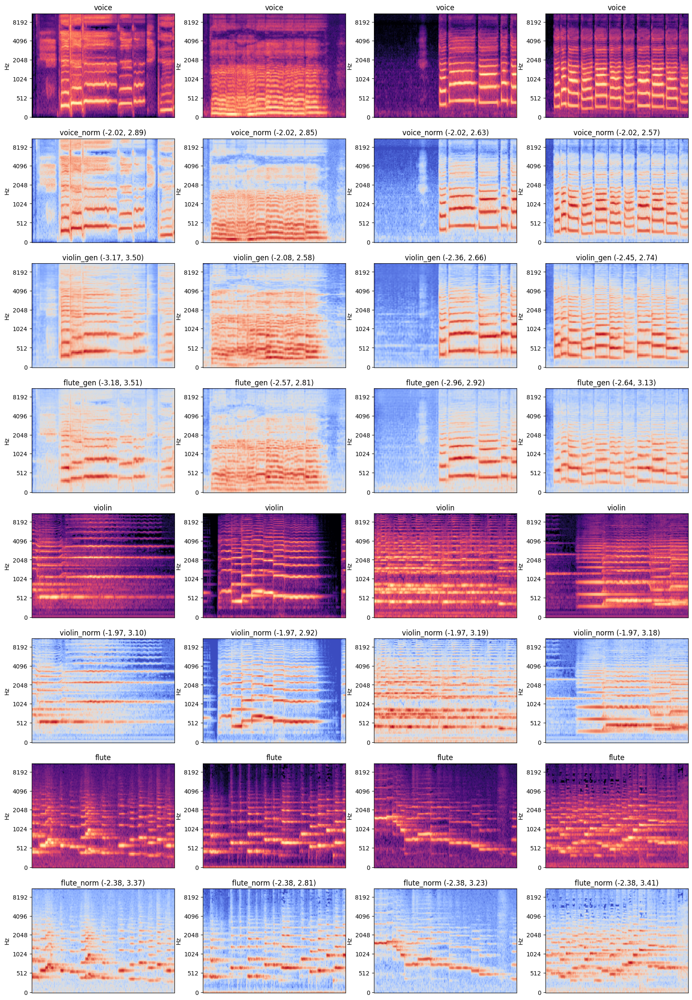

In [ ]:
#@title Check generated mel spectrogram


loader_batch_voice = flute_loader_batch["voice"]
loader_batch_violin = violin_loader_batch["instrument"]
loader_batch_flute = flute_loader_batch["instrument"]
loader_batch_voice_norm = normalize(loader_batch_voice, mean_voice, std_voice)

violin_GA2B = VC2Generator(HYPERPARAMETER["mel_dim"], loader_batch_voice.shape[-1])
violin_checkpoint = torch.load(os.path.join(OUTPUT_DIR, "violin_checkpoint_40000.pth.tar"), map_location="cpu")
violin_GA2B.load_state_dict(violin_checkpoint["generator_A2B_state_dict"])

flute_GA2B = VC2Generator(HYPERPARAMETER["mel_dim"], loader_batch_voice.shape[-1])
flute_checkpoint = torch.load(os.path.join(OUTPUT_DIR, "flute_checkpoint_45000.pth.tar"), map_location="cpu")
flute_GA2B.load_state_dict(flute_checkpoint["generator_A2B_state_dict"])

loader_batch_voice_signal = flute_loader_batch["voice_signal"]
loader_batch_violin_signal = violin_loader_batch["instrument_signal"]
loader_batch_flute_signal = flute_loader_batch["instrument_signal"]

plt.figure(figsize=(20, 30))
cols = 4

with torch.no_grad():
    violin_GA2B.eval()
    flute_GA2B.eval()
    generated_violin_spectrogram = violin_GA2B(loader_batch_voice_norm, torch.ones_like(loader_batch_voice_norm))
    generated_flute_spectrogram = flute_GA2B(loader_batch_voice_norm, torch.ones_like(loader_batch_voice_norm))

for i in range(cols):
    plt.subplot(8, cols, i + 1)
    plt.title(f"voice")
    librosa.display.specshow(torch_to_np(loader_batch_voice[i]), y_axis="mel")

    plt.subplot(8, cols, cols + i + 1)
    loader_batch_voice_norm = normalize(loader_batch_voice[i], mean_voice, std_voice)
    plt.title(f"voice_norm ({loader_batch_voice_norm.min():.2f}, {loader_batch_voice_norm.max():.2f})")
    librosa.display.specshow(torch_to_np(loader_batch_voice_norm), y_axis="mel")

    plt.subplot(8, cols, cols * 2 + i + 1)
    plt.title(f"violin_gen ({generated_violin_spectrogram[i].min():.2f}, {generated_violin_spectrogram[i].max():.2f})")
    librosa.display.specshow(torch_to_np(generated_violin_spectrogram[i]), y_axis="mel")

    plt.subplot(8, cols, cols * 3 + i + 1)
    plt.title(f"flute_gen ({generated_flute_spectrogram[i].min():.2f}, {generated_flute_spectrogram[i].max():.2f})")
    librosa.display.specshow(torch_to_np(generated_flute_spectrogram[i]), y_axis="mel")

    plt.subplot(8, cols, cols * 4 + i + 1)
    plt.title(f"violin")
    librosa.display.specshow(torch_to_np(loader_batch_violin[i]), y_axis="mel")

    plt.subplot(8, cols, cols * 5 + i + 1)
    violin_norm = normalize(loader_batch_violin[i], mean_violin, std_violin)
    plt.title(f"violin_norm ({violin_norm.min():.2f}, {violin_norm.max():.2f})")
    librosa.display.specshow(torch_to_np(violin_norm), y_axis="mel")

    plt.subplot(8, cols, cols * 6 + i + 1)
    plt.title(f"flute")
    librosa.display.specshow(torch_to_np(loader_batch_flute[i]), y_axis="mel")

    plt.subplot(8, cols, cols * 7 + i + 1)
    flute_norm = normalize(loader_batch_flute[i], mean_flute, std_flute)
    plt.title(f"flute_norm ({flute_norm.min():.2f}, {flute_norm.max():.2f})")
    librosa.display.specshow(torch_to_np(flute_norm), y_axis="mel")

plt.show()

In [ ]:
#@title Convert to audio

violin_hifi_gan = HIFI_Generator(in_channels=128, out_channels=1)
violin_hifi_checkpoint = torch.load(HIFI_VIOLIN_CHECKPOINT_DIR, map_location="cpu")
violin_hifi_gan.load_state_dict(violin_hifi_checkpoint["generator"])

flute_hifi_gan = HIFI_Generator(in_channels=128, out_channels=1)
flute_hifi_checkpoint = torch.load(HIFI_FLUTE_CHECKPOINT_DIR, map_location="cpu")
flute_hifi_gan.load_state_dict(flute_hifi_checkpoint["generator"])

for i in range(cols):
    voice_signal = loader_batch_voice_signal[i]

    violin_signal = loader_batch_violin_signal[i]
    violin_norm = normalize(loader_batch_violin[i], mean_violin, std_violin)
    reconstructed_violin = violin_hifi_gan(violin_norm)

    flute_signal = loader_batch_flute_signal[i]
    flute_norm = normalize(loader_batch_flute[i], mean_flute, std_flute)
    reconstructed_flute = flute_hifi_gan(flute_norm)

    with torch.no_grad():
        violin_hifi_gan.eval()
        flute_hifi_gan.eval()
        # generated_violin_signal = violin_hifi_gan(generated_violin_spectrogram[i])
        # generated_flute_signal = flute_hifi_gan(generated_flute_spectrogram[i])
        generated_violin_signal = violin_hifi_gan(rescale(generated_violin_spectrogram[i].squeeze(dim=0), violin_norm))
        generated_flute_signal = flute_hifi_gan(rescale(generated_flute_spectrogram[i].squeeze(dim=0), flute_norm))

    print(f"sample {i+1} real voice {voice_signal.shape}")
    ipd.display(ipd.Audio(torch_to_np(voice_signal), rate=22050))
    print(f"sample {i+1} generated violin {generated_violin_spectrogram[i].shape} -> {generated_violin_signal.shape}")
    ipd.display(ipd.Audio(torch_to_np(generated_violin_signal), rate=22050))
    print(f"sample {i+1} generated flute {generated_flute_spectrogram[i].shape} -> {generated_flute_signal.shape}")
    ipd.display(ipd.Audio(torch_to_np(generated_flute_signal), rate=22050))
    # print(f"sample {i+1} real violin {violin_signal.shape}")
    # ipd.display(ipd.Audio(torch_to_np(violin_signal), rate=22050))
    # print(f"sample {i+1} reconstructed violin {reconstructed_violin.shape}")
    # ipd.display(ipd.Audio(torch_to_np(reconstructed_violin), rate=22050))
    # print(f"sample {i+1} real flute {flute_signal.shape}")
    # ipd.display(ipd.Audio(torch_to_np(flute_signal), rate=22050))
    # print(f"sample {i+1} reconstructed flute {reconstructed_flute.shape}")
    # ipd.display(ipd.Audio(torch_to_np(reconstructed_flute), rate=22050))

/usr/local/lib/python3.11/dist-packages/torch/nn/utils/weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


sample 1 real voice torch.Size([88200])


sample 1 generated violin torch.Size([1, 128, 344]) -> torch.Size([1, 87542])


sample 1 generated flute torch.Size([1, 128, 344]) -> torch.Size([1, 87542])


sample 2 real voice torch.Size([88200])


sample 2 generated violin torch.Size([1, 128, 344]) -> torch.Size([1, 87542])


sample 2 generated flute torch.Size([1, 128, 344]) -> torch.Size([1, 87542])


sample 3 real voice torch.Size([88200])


sample 3 generated violin torch.Size([1, 128, 344]) -> torch.Size([1, 87542])


sample 3 generated flute torch.Size([1, 128, 344]) -> torch.Size([1, 87542])


sample 4 real voice torch.Size([88200])


sample 4 generated violin torch.Size([1, 128, 344]) -> torch.Size([1, 87542])


sample 4 generated flute torch.Size([1, 128, 344]) -> torch.Size([1, 87542])


/content/wav_data_sync_with_midi/F02_0124_0001_1_D.wav


/usr/local/lib/python3.11/dist-packages/torch/nn/utils/weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


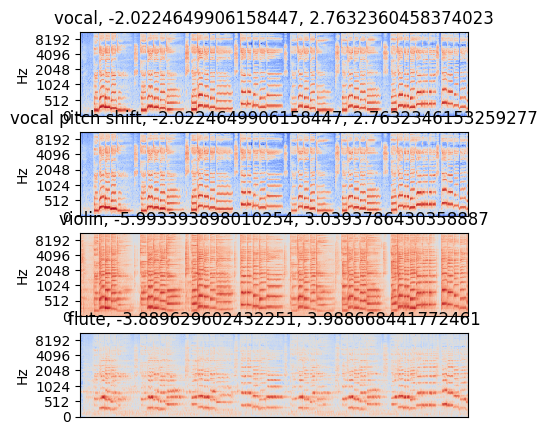

In [ ]:
#@title Testing
voice_path =  "/content/wav_data_sync_with_midi"
voice_file_list =  [os.path.join(voice_path, f) for f in os.listdir(voice_path) if f.endswith(".wav")]
random_file = voice_file_list[542]

vocal, sr = librosa.load(random_file, sr=22050, mono=True)
print(random_file)
fig, ax = plt.subplots(nrows=4, figsize=(5, 5))

vocal_tensor = torch.from_numpy(vocal).unsqueeze(dim=0)
# print(vocal_tensor.shape)
vocal_log_mel = audio_to_log_mel_torch(vocal_tensor).unsqueeze(dim=0)
vocal_log_mel = normalize(vocal_log_mel, mean_voice, std_voice)
# print(vocal_log_mel.shape)

librosa.display.specshow(torch_to_np(vocal_log_mel), y_axis="mel", ax=ax[0])
ax[0].set_title(f"vocal, {vocal_log_mel.min()}, {vocal_log_mel.max()}")

# print(len(vocal), sr)
ipd.display(ipd.Audio(vocal, rate=sr))
vocal_pitch_shift = pitch_shift(vocal, 0)

vocal_tensor = torch.from_numpy(vocal_pitch_shift).unsqueeze(dim=0)
# print(vocal_tensor.shape)
vocal_log_mel = audio_to_log_mel_torch(vocal_tensor).unsqueeze(dim=0)
vocal_log_mel = normalize(vocal_log_mel, mean_voice, std_voice)
# print(vocal_log_mel.shape)

librosa.display.specshow(torch_to_np(vocal_log_mel), y_axis="mel", ax=ax[1])
ax[1].set_title(f"vocal pitch shift, {vocal_log_mel.min()}, {vocal_log_mel.max()}")

vocal_to_violin_GA2B = VC2Generator(vocal_log_mel.shape[-2], vocal_log_mel.shape[-1])
violin_checkpoint = torch.load(os.path.join(OUTPUT_DIR, "violin_checkpoint_40000.pth.tar"), map_location="cpu")
vocal_to_violin_GA2B.load_state_dict(violin_checkpoint["generator_A2B_state_dict"])
vocal_to_violin = vocal_to_violin_GA2B(vocal_log_mel, torch.ones_like(vocal_log_mel))
# vocal_to_violin = rescale(vocal_to_violin, y_min=-2.02, y_max=2.8)
# print(vocal_to_violin.shape)

librosa.display.specshow(torch_to_np(vocal_to_violin), y_axis="mel", ax=ax[2])
ax[2].set_title(f"violin, {vocal_to_violin.min()}, {vocal_to_violin.max()}")

vocal_to_flute_GA2B = VC2Generator(vocal_log_mel.shape[-2], vocal_log_mel.shape[-1])
flute_checkpoint = torch.load(os.path.join(OUTPUT_DIR, "flute_checkpoint_45000.pth.tar"), map_location="cpu")
vocal_to_flute_GA2B.load_state_dict(flute_checkpoint["generator_A2B_state_dict"])
vocal_to_flute = vocal_to_flute_GA2B(vocal_log_mel, torch.ones_like(vocal_log_mel))
# vocal_to_flute = rescale(vocal_to_flute, y_min=-2.38, y_max=3.5)
# print(vocal_to_flute.shape)

librosa.display.specshow(torch_to_np(vocal_to_flute), y_axis="mel", ax=ax[3])
ax[3].set_title(f"flute, {vocal_to_flute.min()}, {vocal_to_flute.max()}")

violin_hifi_gan = HIFI_Generator(in_channels=128, out_channels=1)
flute_hifi_gan = HIFI_Generator(in_channels=128, out_channels=1)

violin_checkpoint = torch.load(HIFI_VIOLIN_CHECKPOINT_DIR, map_location="cpu")
violin_hifi_gan.load_state_dict(violin_checkpoint["generator"])
flute_checkpoint = torch.load(HIFI_FLUTE_CHECKPOINT_DIR, map_location="cpu")
flute_hifi_gan.load_state_dict(flute_checkpoint["generator"])

vocal_to_violin_to_signal = interpolate_signal(violin_hifi_gan(vocal_to_violin.squeeze(dim=1)), vocal)
vocal_to_flute_to_signal = interpolate_signal(flute_hifi_gan(vocal_to_flute.squeeze(dim=1)), vocal)
# print(vocal_to_violin_to_signal.shape)
# print(vocal_to_flute_to_signal.shape)
ipd.display(ipd.Audio(torch_to_np(vocal_to_violin_to_signal), rate=22050))
ipd.display(ipd.Audio(torch_to_np(vocal_to_flute_to_signal), rate=22050))

In [ ]:
os.path.basename(random_file)

'F02_0124_0001_1_D.wav'

In [ ]:
sf.write(os.path.join(DRIVE_DIR, f"test_vocal/{os.path.basename(random_file)}"), vocal, 22050)
sf.write(os.path.join(DRIVE_DIR, f"test_vocal/{os.path.basename(random_file).split(".")[0]}_violin.wav"), torch_to_np(vocal_to_violin), 22050)

In [ ]:
sf.write(os.path.join(DRIVE_DIR, f"test_vocal/{os.path.basename(random_file).split(".")[0]}_flute.wav"), torch_to_np(vocal_to_flute_to_signal), 22050)